In [2]:
# =============================================
# Predictive Maintenance for Engine Health
# EDA + Data Preparation + Baseline Logistic Regression Model
# =============================================


# 1. Import Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve

# ---------------------------------------------
# 2. Load Dataset
# ---------------------------------------------
# Update path if required
df = pd.read_csv("engine_data.csv")

# ---------------------------------------------
# 3. Basic Data Understanding
# ---------------------------------------------
print("\nDataset Shape:", df.shape)
print("\nData Types:\n", df.dtypes)
print("\nSample Records:\n", df.head())



# ---------------------------------------------
# 4. Missing Value Analysis
# ---------------------------------------------
print("\nMissing Values (%):")
print(df.isnull().mean() * 100)


# Treatment: Fill numeric missing values with median
for col in df.columns:
    if df[col].isnull().sum() > 0:
        df[col].fillna(df[col].median(), inplace=True)


# ---------------------------------------------
# 5. Data Irregularities & Summary Stats
# ---------------------------------------------
print("\nStatistical Summary:\n", df.describe())



# ---------------------------------------------
# 6. Univariate Analysis
# ---------------------------------------------
numeric_cols = df.drop('Engine Condition', axis=1).columns


for col in numeric_cols:
    plt.figure()
    sns.histplot(df[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.show()


# Target Variable Distribution
plt.figure()
sns.countplot(x='Engine Condition', data=df)
plt.title('Engine Condition Distribution')
plt.show()


import matplotlib.pyplot as plt
import seaborn as sns

# Boxplot for each Engine Parameter (Recommended for EDA)
engine_features = [
    'Engine rpm',
    'Lub oil pressure',
    'Fuel pressure',
    'Coolant pressure',
    'lub oil temp',
    'Coolant temp'
]

for feature in engine_features:
    plt.figure(figsize=(6, 4))
    sns.boxplot(y=df[feature])
    plt.title(f'Boxplot of {feature}')
    plt.ylabel(feature)
    plt.show()

# Boxplot by Engine Condition (Failure vs Normal)
for feature in engine_features:
    plt.figure(figsize=(6, 4))
    sns.boxplot(x='Engine Condition', y=feature, data=df)
    plt.title(f'{feature} by Engine Condition')
    plt.xlabel('Engine Condition (0 = Normal, 1 = Failure)')
    plt.ylabel(feature)
    plt.show()

#Combined Boxplot (Quick Outlier Scan)
plt.figure(figsize=(12, 6))
sns.boxplot(data=df[engine_features])
plt.title('Boxplot of All Engine Parameters')
plt.xticks(rotation=45)
plt.show()


# ---------------------------------------------
# 7. Bivariate Analysis
# ---------------------------------------------
for col in numeric_cols:
    plt.figure()
    sns.boxplot(x='Engine Condition', y=col, data=df)
    plt.title(f'{col} vs Engine Condition')
    plt.show()


# ---------------------------------------------
# 8. Correlation Analysis
# ---------------------------------------------
plt.figure(figsize=(10,6))
corr = df.corr()
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()


import seaborn as sns
import matplotlib.pyplot as plt

# Select numeric columns
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns

# Pair plot
sns.pairplot(
    df[numeric_cols],
    hue='Engine Condition',
    diag_kind='kde',
    plot_kws={'alpha': 0.6}
)

plt.suptitle('Pair Plot of Engine Sensor Variables', y=1.02)
plt.show()

sns.pairplot(df[numeric_cols.drop('Engine Condition')])
plt.suptitle('Pair Plot of Engine Sensor Variables', y=1.02)
plt.show()

df_sample = df.sample(frac=0.3, random_state=42)

sns.pairplot(
    df_sample[numeric_cols],
    hue='Engine Condition',
    diag_kind='kde'
)

plt.suptitle('Pair Plot (Sampled Data)', y=1.02)
plt.show()

import seaborn as sns
import matplotlib.pyplot as plt

engine_features = [
    'Engine rpm',
    'Lub oil pressure',
    'Fuel pressure',
    'Coolant pressure',
    'lub oil temp',
    'Coolant temp'
]

df_faulty = df[df['Engine Condition'] == 1]

for feature in engine_features:
    plt.figure(figsize=(6, 4))
    sns.histplot(df_faulty[feature], kde=True)
    plt.title(f'Distribution of {feature} (Engine Condition = 1)')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.show()
df_normal = df[df['Engine Condition'] == 0]

for feature in engine_features:
    plt.figure(figsize=(6, 4))
    sns.histplot(df_normal[feature], kde=True)
    plt.title(f'Distribution of {feature} (Engine Condition = 0)')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.show()
for feature in engine_features:
    plt.figure(figsize=(6, 4))
    sns.kdeplot(df[df['Engine Condition'] == 0][feature], label='Normal (0)', fill=True)
    sns.kdeplot(df[df['Engine Condition'] == 1][feature], label='Faulty (1)', fill=True)
    plt.title(f'Distribution Comparison of {feature}')
    plt.xlabel(feature)
    plt.legend()
    plt.show()


# ---------------------------------------------
# 9. Multivariate Analysis – PCA
# ---------------------------------------------
X = df.drop('Engine Condition', axis=1)
y = df['Engine Condition']


scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


pca = PCA()
X_pca = pca.fit_transform(X_scaled)


plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_), marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('PCA – Explained Variance')
plt.show()



# Features & target
features = [
    'Engine rpm',
    'Lub oil pressure',
    'Fuel pressure',
    'Coolant pressure',
    'lub oil temp',
    'Coolant temp'
]

X = df[features]
y = df['Engine Condition']

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Fit PCA
pca = PCA()
X_pca = pca.fit_transform(X_scaled)
plt.figure(figsize=(6, 4))
plt.plot(
    np.cumsum(pca.explained_variance_ratio_),
    marker='o'
)
plt.xlabel('Number of PCA Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('PCA Components vs Cumulative Variance')
plt.grid(True)
plt.show()
pc1_loadings = pd.Series(
    pca.components_[0],
    index=features
)

plt.figure(figsize=(6, 4))
pc1_loadings.sort_values().plot(kind='barh')
plt.title('PCA Component 1 Loadings')
plt.xlabel('Loading Value')
plt.show()
pc2_loadings = pd.Series(
    pca.components_[1],
    index=features
)

plt.figure(figsize=(6, 4))
pc2_loadings.sort_values().plot(kind='barh')
plt.title('PCA Component 2 Loadings')
plt.xlabel('Loading Value')
plt.show()

plt.figure(figsize=(6, 5))
sns.scatterplot(
    x=X_pca[:, 0],
    y=X_pca[:, 1],
    hue=y,
    palette='Set1',
    alpha=0.7
)

plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA Scatter Plot (PC1 vs PC2)')
plt.legend(title='Engine Condition')
plt.show()

pca_df = pd.DataFrame({
    'PC1': X_pca[:, 0],
    'PC2': X_pca[:, 1],
    'Engine_Condition': y
})

plt.figure(figsize=(6, 4))
sns.kdeplot(
    data=pca_df,
    x='PC1',
    hue='Engine_Condition',
    fill=True
)
plt.title('PCA Density Plot – PC1')
plt.xlabel('Principal Component 1')
plt.show()

plt.figure(figsize=(10, 5))
sns.boxplot(data=df[features])
plt.title('Box Plots for Outlier Detection')
plt.xticks(rotation=45)
plt.show()


plt.figure(figsize=(10, 5))
sns.boxplot(data=df[features])
plt.title('Box Plots for Outlier Detection')
plt.xticks(rotation=45)
plt.show()



# ---------------------------------------------
# 10. Outlier Treatment (IQR Method)
# ---------------------------------------------
for col in numeric_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    df[col] = np.where(df[col] > upper, upper,
    np.where(df[col] < lower, lower, df[col]))

FileNotFoundError: [Errno 2] No such file or directory: 'engine_data.csv'

In [3]:
from google.colab import files
import os

if not os.path.exists('engine_data.csv'):
    uploaded = files.upload()

    for fn in uploaded.keys():
        print(f'User uploaded file "{fn}" with length {len(uploaded[fn])} bytes')
else:
    print('engine_data.csv already exists.')

Saving engine_data.csv to engine_data.csv
User uploaded file "engine_data.csv" with length 1301801 bytes



Dataset Shape: (19535, 7)

Data Types:
 Engine rpm            int64
Lub oil pressure    float64
Fuel pressure       float64
Coolant pressure    float64
lub oil temp        float64
Coolant temp        float64
Engine Condition      int64
dtype: object

Sample Records:
    Engine rpm  Lub oil pressure  Fuel pressure  Coolant pressure  \
0         700          2.493592      11.790927          3.178981   
1         876          2.941606      16.193866          2.464504   
2         520          2.961746       6.553147          1.064347   
3         473          3.707835      19.510172          3.727455   
4         619          5.672919      15.738871          2.052251   

   lub oil temp  Coolant temp  Engine Condition  
0     84.144163     81.632187                 1  
1     77.640934     82.445724                 0  
2     77.752266     79.645777                 1  
3     74.129907     71.774629                 1  
4     78.396989     87.000225                 0  

Missing Values (%):
E

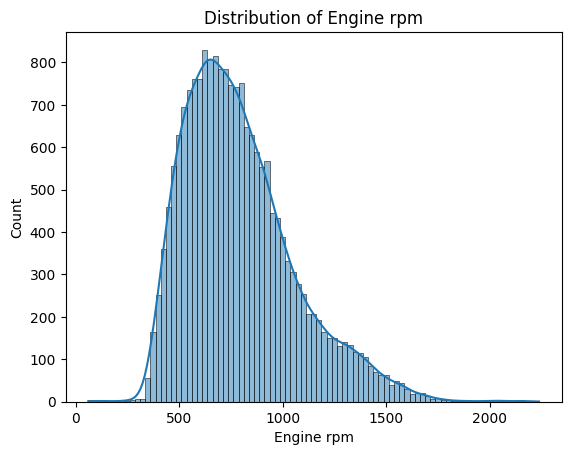

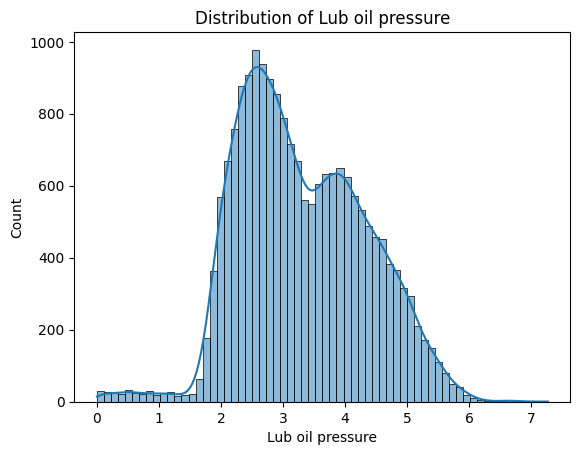

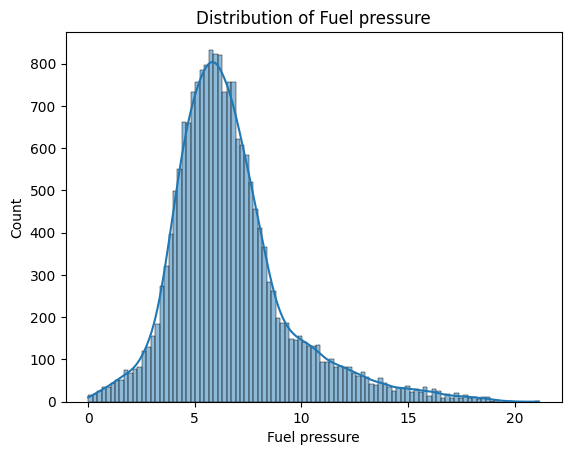

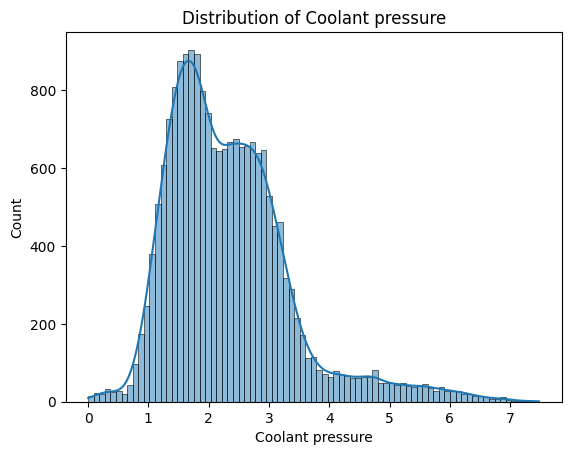

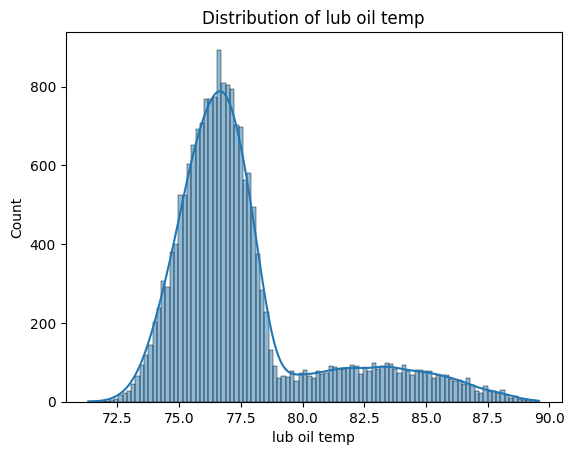

...

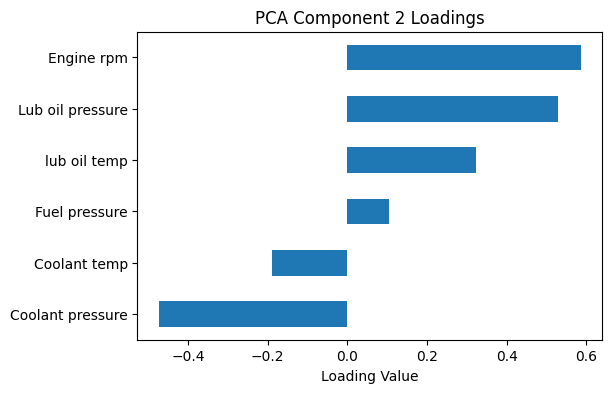

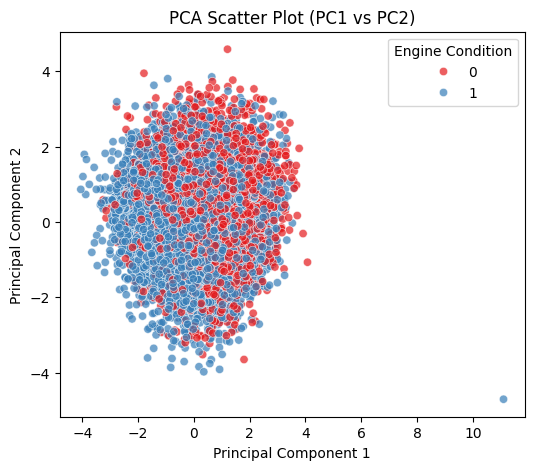

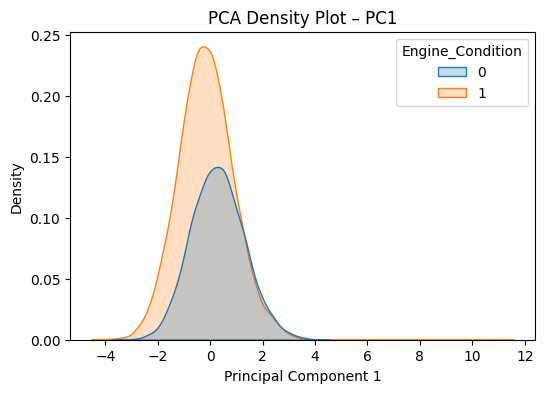

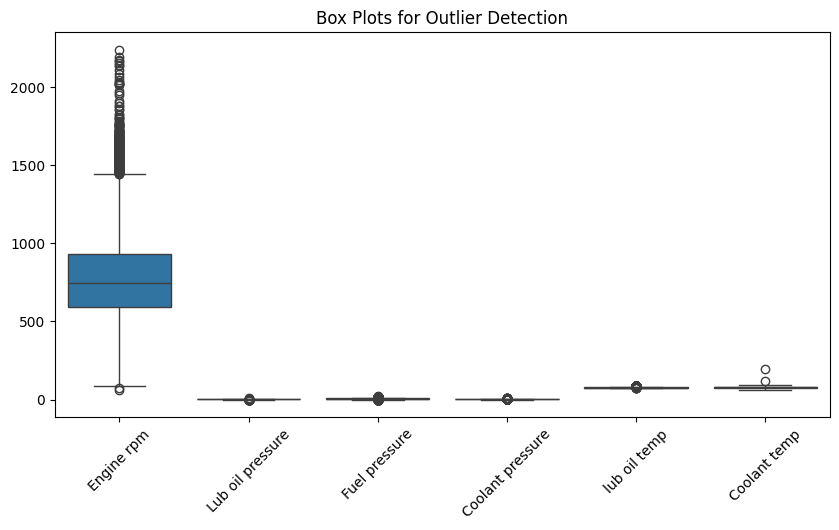

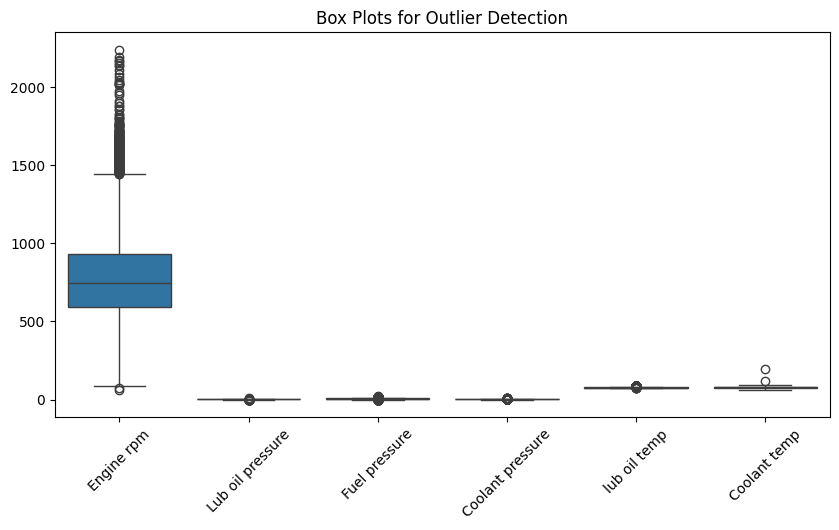

In [4]:
# =============================================
# Predictive Maintenance for Engine Health
# EDA + Data Preparation + Baseline Logistic Regression Model
# =============================================


# 1. Import Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve

# ---------------------------------------------
# 2. Load Dataset
# ---------------------------------------------
# Update path if required
df = pd.read_csv("engine_data.csv")

# ---------------------------------------------
# 3. Basic Data Understanding
# ---------------------------------------------
print("\nDataset Shape:", df.shape)
print("\nData Types:\n", df.dtypes)
print("\nSample Records:\n", df.head())



# ---------------------------------------------
# 4. Missing Value Analysis
# ---------------------------------------------
print("\nMissing Values (%):")
print(df.isnull().mean() * 100)


# Treatment: Fill numeric missing values with median
for col in df.columns:
    if df[col].isnull().sum() > 0:
        df[col].fillna(df[col].median(), inplace=True)


# ---------------------------------------------
# 5. Data Irregularities & Summary Stats
# ---------------------------------------------
print("\nStatistical Summary:\n", df.describe())



# ---------------------------------------------
# 6. Univariate Analysis
# ---------------------------------------------
numeric_cols = df.drop('Engine Condition', axis=1).columns


for col in numeric_cols:
    plt.figure()
    sns.histplot(df[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.show()


# Target Variable Distribution
plt.figure()
sns.countplot(x='Engine Condition', data=df)
plt.title('Engine Condition Distribution')
plt.show()


import matplotlib.pyplot as plt
import seaborn as sns

# Boxplot for each Engine Parameter (Recommended for EDA)
engine_features = [
    'Engine rpm',
    'Lub oil pressure',
    'Fuel pressure',
    'Coolant pressure',
    'lub oil temp',
    'Coolant temp'
]

for feature in engine_features:
    plt.figure(figsize=(6, 4))
    sns.boxplot(y=df[feature])
    plt.title(f'Boxplot of {feature}')
    plt.ylabel(feature)
    plt.show()

# Boxplot by Engine Condition (Failure vs Normal)
for feature in engine_features:
    plt.figure(figsize=(6, 4))
    sns.boxplot(x='Engine Condition', y=feature, data=df)
    plt.title(f'{feature} by Engine Condition')
    plt.xlabel('Engine Condition (0 = Normal, 1 = Failure)')
    plt.ylabel(feature)
    plt.show()

#Combined Boxplot (Quick Outlier Scan)
plt.figure(figsize=(12, 6))
sns.boxplot(data=df[engine_features])
plt.title('Boxplot of All Engine Parameters')
plt.xticks(rotation=45)
plt.show()


# ---------------------------------------------
# 7. Bivariate Analysis
# ---------------------------------------------
for col in numeric_cols:
    plt.figure()
    sns.boxplot(x='Engine Condition', y=col, data=df)
    plt.title(f'{col} vs Engine Condition')
    plt.show()


# ---------------------------------------------
# 8. Correlation Analysis
# ---------------------------------------------
plt.figure(figsize=(10,6))
corr = df.corr()
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()


import seaborn as sns
import matplotlib.pyplot as plt

# Select numeric columns
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns

# Pair plot
sns.pairplot(
    df[numeric_cols],
    hue='Engine Condition',
    diag_kind='kde',
    plot_kws={'alpha': 0.6}
)

plt.suptitle('Pair Plot of Engine Sensor Variables', y=1.02)
plt.show()

sns.pairplot(df[numeric_cols.drop('Engine Condition')])
plt.suptitle('Pair Plot of Engine Sensor Variables', y=1.02)
plt.show()

df_sample = df.sample(frac=0.3, random_state=42)

sns.pairplot(
    df_sample[numeric_cols],
    hue='Engine Condition',
    diag_kind='kde'
)

plt.suptitle('Pair Plot (Sampled Data)', y=1.02)
plt.show()

import seaborn as sns
import matplotlib.pyplot as plt

engine_features = [
    'Engine rpm',
    'Lub oil pressure',
    'Fuel pressure',
    'Coolant pressure',
    'lub oil temp',
    'Coolant temp'
]

df_faulty = df[df['Engine Condition'] == 1]

for feature in engine_features:
    plt.figure(figsize=(6, 4))
    sns.histplot(df_faulty[feature], kde=True)
    plt.title(f'Distribution of {feature} (Engine Condition = 1)')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.show()
df_normal = df[df['Engine Condition'] == 0]

for feature in engine_features:
    plt.figure(figsize=(6, 4))
    sns.histplot(df_normal[feature], kde=True)
    plt.title(f'Distribution of {feature} (Engine Condition = 0)')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.show()
for feature in engine_features:
    plt.figure(figsize=(6, 4))
    sns.kdeplot(df[df['Engine Condition'] == 0][feature], label='Normal (0)', fill=True)
    sns.kdeplot(df[df['Engine Condition'] == 1][feature], label='Faulty (1)', fill=True)
    plt.title(f'Distribution Comparison of {feature}')
    plt.xlabel(feature)
    plt.legend()
    plt.show()


# ---------------------------------------------
# 9. Multivariate Analysis – PCA
# ---------------------------------------------
X = df.drop('Engine Condition', axis=1)
y = df['Engine Condition']


scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


pca = PCA()
X_pca = pca.fit_transform(X_scaled)


plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_), marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('PCA – Explained Variance')
plt.show()



# Features & target
features = [
    'Engine rpm',
    'Lub oil pressure',
    'Fuel pressure',
    'Coolant pressure',
    'lub oil temp',
    'Coolant temp'
]

X = df[features]
y = df['Engine Condition']

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Fit PCA
pca = PCA()
X_pca = pca.fit_transform(X_scaled)
plt.figure(figsize=(6, 4))
plt.plot(
    np.cumsum(pca.explained_variance_ratio_),
    marker='o'
)
plt.xlabel('Number of PCA Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('PCA Components vs Cumulative Variance')
plt.grid(True)
plt.show()
pc1_loadings = pd.Series(
    pca.components_[0],
    index=features
)

plt.figure(figsize=(6, 4))
pc1_loadings.sort_values().plot(kind='barh')
plt.title('PCA Component 1 Loadings')
plt.xlabel('Loading Value')
plt.show()
pc2_loadings = pd.Series(
    pca.components_[1],
    index=features
)

plt.figure(figsize=(6, 4))
pc2_loadings.sort_values().plot(kind='barh')
plt.title('PCA Component 2 Loadings')
plt.xlabel('Loading Value')
plt.show()

plt.figure(figsize=(6, 5))
sns.scatterplot(
    x=X_pca[:, 0],
    y=X_pca[:, 1],
    hue=y,
    palette='Set1',
    alpha=0.7
)

plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA Scatter Plot (PC1 vs PC2)')
plt.legend(title='Engine Condition')
plt.show()

pca_df = pd.DataFrame({
    'PC1': X_pca[:, 0],
    'PC2': X_pca[:, 1],
    'Engine_Condition': y
})

plt.figure(figsize=(6, 4))
sns.kdeplot(
    data=pca_df,
    x='PC1',
    hue='Engine_Condition',
    fill=True
)
plt.title('PCA Density Plot – PC1')
plt.xlabel('Principal Component 1')
plt.show()

plt.figure(figsize=(10, 5))
sns.boxplot(data=df[features])
plt.title('Box Plots for Outlier Detection')
plt.xticks(rotation=45)
plt.show()


plt.figure(figsize=(10, 5))
sns.boxplot(data=df[features])
plt.title('Box Plots for Outlier Detection')
plt.xticks(rotation=45)
plt.show()



# ---------------------------------------------
# 10. Outlier Treatment (IQR Method)
# ---------------------------------------------
for col in numeric_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    df[col] = np.where(df[col] > upper, upper,
    np.where(df[col] < lower, lower, df[col]))

# New Section

Optimization terminated successfully.
         Current function value: 0.606974
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:       Engine Condition   No. Observations:                19535
Model:                          Logit   Df Residuals:                    19528
Method:                           MLE   Df Model:                            6
Date:                Sat, 13 Dec 2025   Pseudo R-squ.:                 0.07851
Time:                        08:35:11   Log-Likelihood:                -11857.
converged:                       True   LL-Null:                       -12867.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const                8.2739      0.569     14.538      0.000       7.158       9.389
Engine rpm 

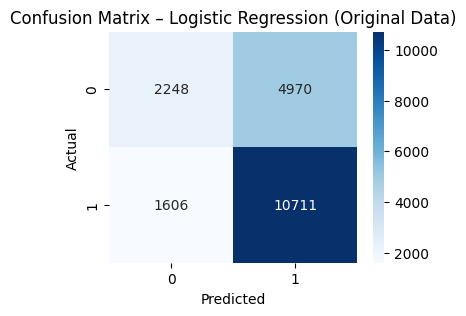

Optimization terminated successfully.
         Current function value: 0.606974
         Iterations 5


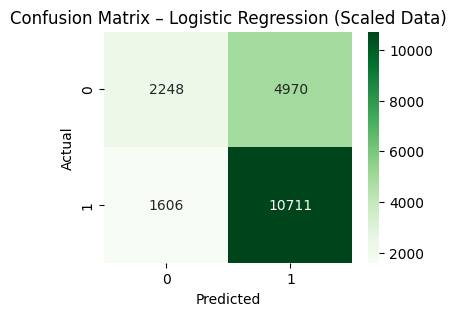

In [ ]:
import statsmodels.api as sm

# Ensure correct dtypes
X = df[
    ['Engine rpm',
     'Lub oil pressure',
     'Fuel pressure',
     'Coolant pressure',
     'lub oil temp',
     'Coolant temp']
].astype(float)

y = df['Engine Condition'].astype(int)

# Add constant explicitly
X_const = sm.add_constant(X, has_constant='add')

# Fit logistic regression
logit_model = sm.Logit(y, X_const)
result = logit_model.fit(method='newton', maxiter=200, disp=True)

# Summary
print(result.summary())

#------------------------------------------
# Logistic Regression on original Dataset
# Confusion Matrix (Training Data)
#-----------------------------------------
# Add constant
X_orig = sm.add_constant(X, has_constant='add')

# Fit model
logit_orig = sm.Logit(y, X_orig)
result_orig = logit_orig.fit(method='newton', maxiter=200)

# Predictions
y_prob_orig = result_orig.predict(X_orig)
y_pred_orig = (y_prob_orig >= 0.5).astype(int)

# Confusion Matrix
cm_orig = confusion_matrix(y, y_pred_orig)

plt.figure(figsize=(4, 3))
sns.heatmap(
    cm_orig,
    annot=True,
    fmt='d',
    cmap='Blues'
)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix – Logistic Regression (Original Data)')
plt.show()

#--------------------------------------------------
# Logistic Regression on Scaled Dataset
# Confusion Matrix (Training Data)
#---------------------------------------------

# Scale features (outliers retained)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

X_scaled = pd.DataFrame(X_scaled, columns=features)

# Add constant
X_scaled_const = sm.add_constant(X_scaled, has_constant='add')

# Fit model
logit_scaled = sm.Logit(y, X_scaled_const)
result_scaled = logit_scaled.fit(method='newton', maxiter=200)

# Predictions
y_prob_scaled = result_scaled.predict(X_scaled_const)
y_pred_scaled = (y_prob_scaled >= 0.5).astype(int)

# Confusion Matrix
cm_scaled = confusion_matrix(y, y_pred_scaled)

plt.figure(figsize=(4, 3))
sns.heatmap(
    cm_scaled,
    annot=True,
    fmt='d',
    cmap='Greens'
)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix – Logistic Regression (Scaled Data)')
plt.show()


Optimization terminated successfully.
         Current function value: 0.606974
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:       Engine Condition   No. Observations:                19535
Model:                          Logit   Df Residuals:                    19528
Method:                           MLE   Df Model:                            6
Date:                Sat, 13 Dec 2025   Pseudo R-squ.:                 0.07851
Time:                        09:11:47   Log-Likelihood:                -11857.
converged:                       True   LL-Null:                       -12867.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const                8.2739      0.569     14.538      0.000       7.158       9.389
Engine rpm 

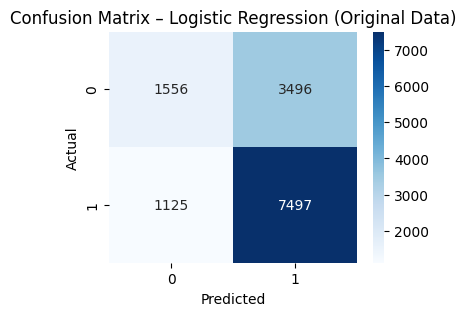

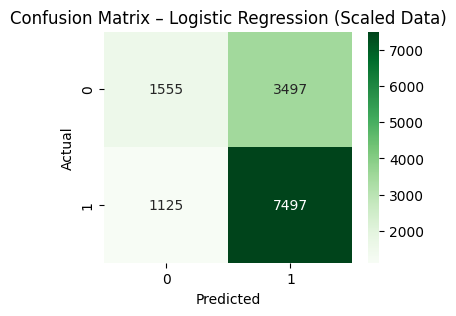

Classification Report (Scaled Data):
              precision    recall  f1-score   support

         0.0       0.58      0.31      0.40      5052
         1.0       0.68      0.87      0.76      8622

    accuracy                           0.66     13674
   macro avg       0.63      0.59      0.58     13674
weighted avg       0.64      0.66      0.63     13674

Optimization terminated successfully.
         Current function value: 0.606974
         Iterations 5


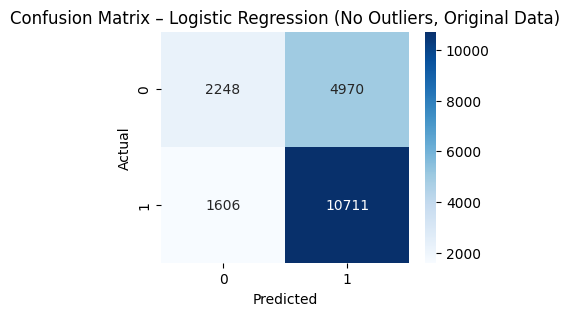

Optimization terminated successfully.
         Current function value: 0.606974
         Iterations 5


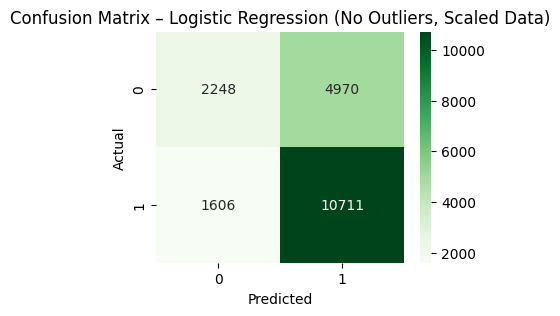

In [ ]:
# Outlier removal ( IOR Method )

df_no_outliers = df.copy()

# Feature & Target Definition (Moved to top to ensure correct usage)
features = [
    'Engine rpm',
    'Lub oil pressure',
    'Fuel pressure',
    'Coolant pressure',
    'lub oil temp',
    'Coolant temp'
]

for col in features:
    Q1 = df_no_outliers[col].quantile(0.25)
    Q3 = df_no_outliers[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    df_no_outliers = df_no_outliers[
        (df_no_outliers[col] >= lower) &
        (df_no_outliers[col] <= upper)
    ]
X_no = df_no_outliers[features]
y_no = df_no_outliers['Engine Condition']


X = df[features]
y = df['Engine Condition']

# Train–Test Split

X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.3,
    random_state=42,
    stratify=y
)
# Logistic Regression on Original (Unscaled) Data
log_reg_orig = LogisticRegression(max_iter=1000)

log_reg_orig.fit(X_train, y_train)

# Add constant explicitly
X_const = sm.add_constant(X, has_constant='add')

# Fit logistic regression
logit_model = sm.Logit(y, X_const)
result = logit_model.fit(method='newton', maxiter=200, disp=True)

# Summary
print(result.summary())

#------------------------------------------
# Logistic Regression on original Dataset
# Confusion Matrix (Training Data)
#-----------------------------------------
# Add constant
X_orig = sm.add_constant(X, has_constant='add')

# Fit model
logit_orig = sm.Logit(y, X_orig)
result_orig = logit_orig.fit(method='newton', maxiter=200)

# Predictions
y_prob_orig = result_orig.predict(X_orig)
y_pred_orig = (y_prob_orig >= 0.5).astype(int)

# Predictions
y_train_pred_orig = log_reg_orig.predict(X_train)


cm_orig = confusion_matrix(y_train, y_train_pred_orig)

plt.figure(figsize=(4, 3))
sns.heatmap(cm_orig, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix – Logistic Regression (Original Data)')
plt.show()



# Logistic Regression on Scaled Data (Recommended)

scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

log_reg_scaled = LogisticRegression(max_iter=1000)

log_reg_scaled.fit(X_train_scaled, y_train)

# Predictions
y_train_pred_scaled = log_reg_scaled.predict(X_train_scaled)

cm_scaled = confusion_matrix(y_train, y_train_pred_scaled)

plt.figure(figsize=(4, 3))
sns.heatmap(cm_scaled, annot=True, fmt='d', cmap='Greens')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix – Logistic Regression (Scaled Data)')
plt.show()


# Classification Report (Optional but Strong)

print("Classification Report (Scaled Data):")
print(classification_report(y_train, y_train_pred_scaled))


#1– Logistic Regression on Original (Unscaled) Data
# ➔ Confusion Matrix (Training Data)

# Add constant
X_no_const = sm.add_constant(X_no, has_constant='add')

# Fit model
logit_orig = sm.Logit(y_no, X_no_const)
result_orig = logit_orig.fit(method='newton', maxiter=200)

# Predictions
y_prob_orig = result_orig.predict(X_no_const)
y_pred_orig = (y_prob_orig >= 0.5).astype(int)

# Confusion Matrix
cm_orig = confusion_matrix(y_no, y_pred_orig)

plt.figure(figsize=(4, 3))
sns.heatmap(cm_orig, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix – Logistic Regression (No Outliers, Original Data)')
plt.show()

#2– Logistic Regression on Scaled Data
#➔ Confusion Matrix (Training Data)

# Scaling
scaler = StandardScaler()
X_no_scaled = scaler.fit_transform(X_no)

X_no_scaled = pd.DataFrame(X_no_scaled, columns=features)

# Add constant
X_no_scaled_const = sm.add_constant(X_no_scaled, has_constant='add')

# Fit model
logit_scaled = sm.Logit(y_no, X_no_scaled_const)
result_scaled = logit_scaled.fit(method='newton', maxiter=200)

# Predictions
y_prob_scaled = result_scaled.predict(X_no_scaled_const)
y_pred_scaled = (y_prob_scaled >= 0.5).astype(int)

# Confusion Matrix
cm_scaled = confusion_matrix(y_no, y_pred_scaled)

plt.figure(figsize=(4, 3))
sns.heatmap(cm_scaled, annot=True, fmt='d', cmap='Greens')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix – Logistic Regression (No Outliers, Scaled Data)')
plt.show()

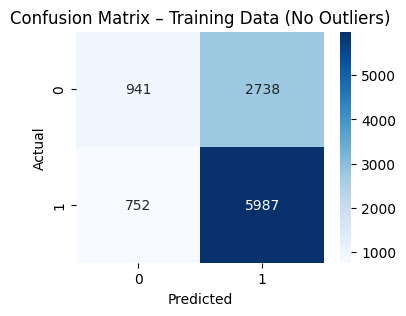

Classification Report – Training Data
              precision    recall  f1-score   support

           0       0.56      0.26      0.35      3679
           1       0.69      0.89      0.77      6739

    accuracy                           0.67     10418
   macro avg       0.62      0.57      0.56     10418
weighted avg       0.64      0.67      0.62     10418


Classification Report – Validation Data (Logistic Regression)
              precision    recall  f1-score   support

           0       0.61      0.27      0.37       789
           1       0.69      0.91      0.79      1444

    accuracy                           0.68      2233
   macro avg       0.65      0.59      0.58      2233
weighted avg       0.66      0.68      0.64      2233



In [7]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Load Dataset (assuming 'engine_data.csv' is available)
df = pd.read_csv("engine_data.csv")

# Handle missing values (as done in previous cells)
for col in df.columns:
    if df[col].isnull().sum() > 0:
        df[col].fillna(df[col].median(), inplace=True)


# Define features list (as defined in previous cells)
features = [
    'Engine rpm',
    'Lub oil pressure',
    'Fuel pressure',
    'Coolant pressure',
    'lub oil temp',
    'Coolant temp'
]

df_no_outliers = df.copy()

for col in features:
    Q1 = df_no_outliers[col].quantile(0.25)
    Q3 = df_no_outliers[col].quantile(0.75)
    IQR = Q3 - Q1

    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    df_no_outliers = df_no_outliers[
        (df_no_outliers[col] >= lower) &
        (df_no_outliers[col] <= upper)
    ]
X = df_no_outliers[features]
y = df_no_outliers['Engine Condition']

# Perform train-validation-test split (70/15/15)
X_temp, X_test, y_temp, y_test = train_test_split(
    X, y, test_size=0.15, random_state=42, stratify=y
)
X_train, X_val, y_train, y_val = train_test_split(
    X_temp, y_temp, test_size=(0.15 / 0.85), random_state=42, stratify=y_temp
)

# Store unscaled versions for later use by tree-based models and VIF
X_train_unscaled = X_train.copy()
X_val_unscaled = X_val.copy()
X_test_unscaled = X_test.copy()

# Scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)

# Convert scaled arrays back to DataFrames with feature names for clarity
X_train_scaled = pd.DataFrame(X_train_scaled, columns=features, index=X_train.index)
X_val_scaled = pd.DataFrame(X_val_scaled, columns=features, index=X_val.index)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=features, index=X_test.index)


log_reg = LogisticRegression(max_iter=1000)

# Train on scaled training data for logistic regression
log_reg.fit(X_train_scaled, y_train)

y_train_pred = log_reg.predict(X_train_scaled)
y_val_pred = log_reg.predict(X_val_scaled) # Prediction on validation set
y_test_pred = log_reg.predict(X_test_scaled) # Prediction on test set


cm_train = confusion_matrix(y_train, y_train_pred)

plt.figure(figsize=(4, 3))
sns.heatmap(cm_train, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix – Training Data (No Outliers)')
plt.show()


print("Classification Report – Training Data")
print(classification_report(y_train, y_train_pred))

# Also calculate metrics for validation set
print("\nClassification Report – Validation Data (Logistic Regression)")
print(classification_report(y_val, y_val_pred))


VIF values (for Logistic Regression model features):

Engine rpm           11.333890
Lub oil pressure     11.651871
Fuel pressure        10.413746
Coolant pressure      8.348642
lub oil temp        196.448419
Coolant temp        159.871859
dtype: float64

KNN(Base:k=5)—Training & Validation Performance at Threshold = 0.5


,Accuracy,Recall,Precision,F1-Score
0,0.7559,0.8662,0.7806,0.8211
1,0.6274,0.7708,0.6896,0.7279


Confusion Matrix – KNN (Training Set)


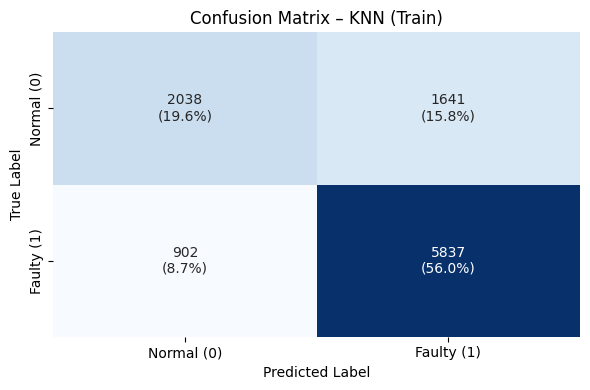

Confusion Matrix – KNN (Validation Set)


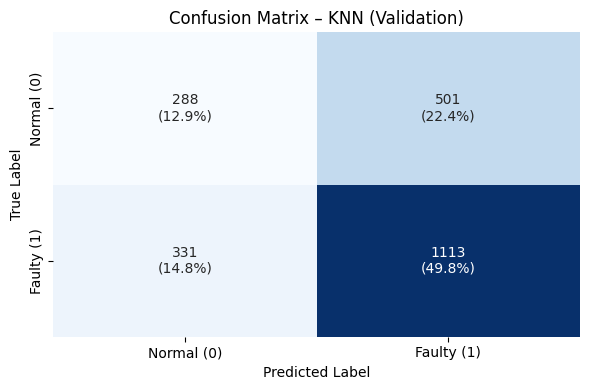


Decision Tree—Training & Validation Performance(Threshold=0.5)


,Accuracy,Recall,Precision,F1-Score
0,1.0000,1.0000,1.0000,1.0000
1,0.5987,0.6911,0.6892,0.6902


Confusion Matrix – Decision Tree (Training)


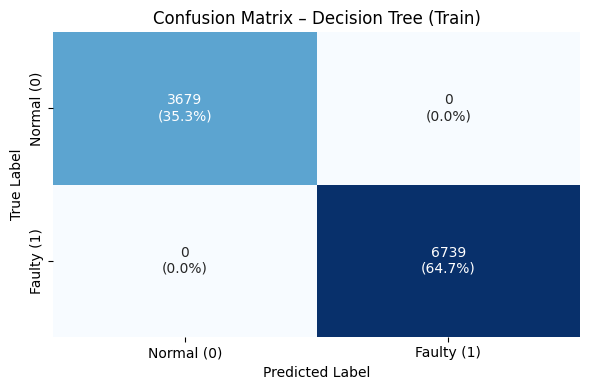

Confusion Matrix – Decision Tree (Validation)


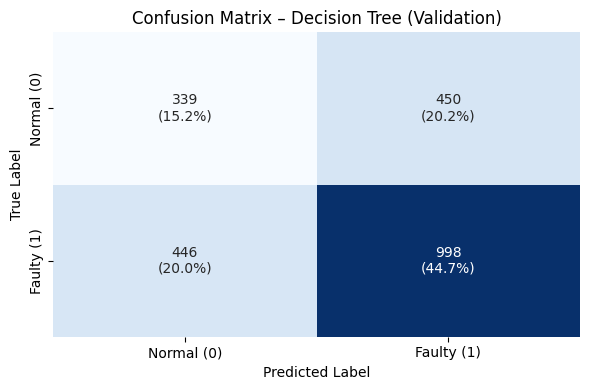


Base Models Comparison at Threshold = 0.5


,Model,Dataset,Accuracy,Recall,Precision,F1-Score
0,Logistic Regression,Training Set,0.66,0.89,0.69,0.77
1,Logistic Regression,Validation Set,0.68,0.91,0.69,0.79
2,KNN (k=5),Training Set,0.76,0.87,0.78,0.82
3,KNN (k=5),Validation Set,0.63,0.77,0.69,0.73
4,Decision Tree,Training Set,1.00,1.00,1.00,1.00
5,Decision Tree,Validation Set,0.60,0.69,0.69,0.69


Training model(Original): Bagging
Training model(Original): Random forest
Training model(Original): GBM
Training model(Original): Adaboost
Training model(Original): XGBoost


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [12:43:35] WARNING: /workspace/src/learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)



All models trained and stored successfully.
Trained models: ['Bagging', 'Random forest', 'GBM', 'Adaboost', 'XGBoost']
Training Set Performance Original Unscaled Data (All Metrics):

        Model  Accuracy  Recall  Precision  F1-Score
      Bagging    0.9868  0.9893     0.9903    0.9898
Random forest    1.0000  1.0000     1.0000    1.0000
          GBM    0.7005  0.8853     0.7177    0.7927
     Adaboost    0.6760  0.8626     0.7036    0.7750
      XGBoost    0.9019  0.9679     0.8900    0.9274

Validation Set Performance on Original Unscaled Data (All Metrics):

        Model  Accuracy  Recall  Precision  F1-Score
      Bagging    0.6180  0.7258     0.6963    0.7107
Random forest    0.6691  0.8532     0.7004    0.7693
          GBM    0.6785  0.8719     0.7026    0.7781
     Adaboost    0.6673  0.8580     0.6972    0.7693
      XGBoost    0.6623  0.8248     0.7039    0.7596


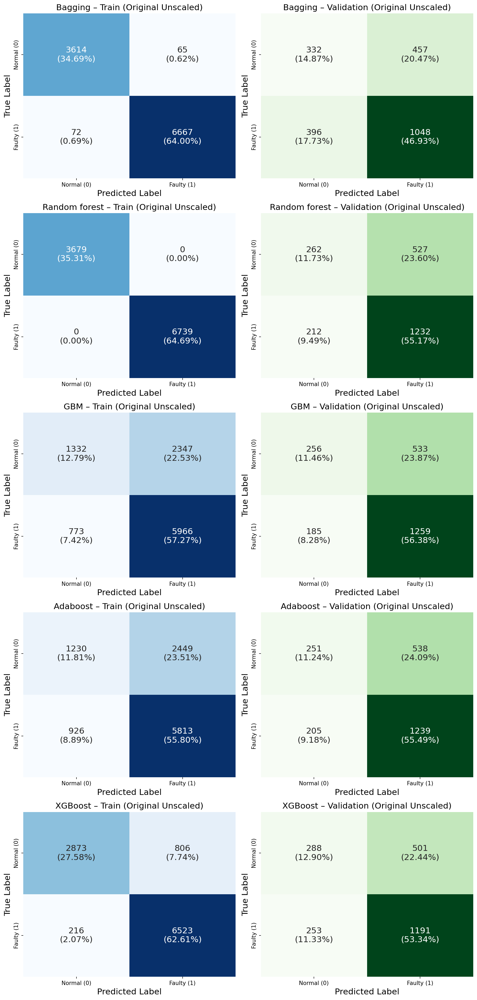

Before Oversampling, counts of label 'Yes': 6739
Before Oversampling, counts of label 'No': 3679 

After Oversampling, counts of label 'Yes': 6739
After Oversampling, counts of label 'No': 6739 

After Oversampling, the shape of train_X: (13478, 6)
After Oversampling, the shape of train_y: (13478,) 

Training (SMOTE) : Bagging
Training (SMOTE) : Random forest
Training (SMOTE) : GBM
Training (SMOTE) : Adaboost
Training (SMOTE) : XGBoost


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [12:43:54] WARNING: /workspace/src/learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)



All models trained on SMOTE data and stored.
Trained models: ['Bagging', 'Random forest', 'GBM', 'Adaboost', 'XGBoost']
Training Set Performance on SMOTE Data (All Metrics):

        Model  Accuracy  Recall  Precision  F1-Score
      Bagging    0.9863  0.9783     0.9941    0.9862
Random forest    1.0000  1.0000     1.0000    1.0000
          GBM    0.6790  0.6431     0.6929    0.6671
     Adaboost    0.6499  0.5925     0.6694    0.6286
      XGBoost    0.8804  0.8460     0.9085    0.8761

Validation Set Performance (All Metrics):

        Model  Accuracy  Recall  Precision  F1-Score
      Bagging    0.5898  0.5838     0.7280    0.6480
Random forest    0.6435  0.6904     0.7407    0.7147
          GBM    0.6328  0.6316     0.7600    0.6899
     Adaboost    0.6350  0.6177     0.7723    0.6864
      XGBoost    0.6073  0.6337     0.7245    0.6760


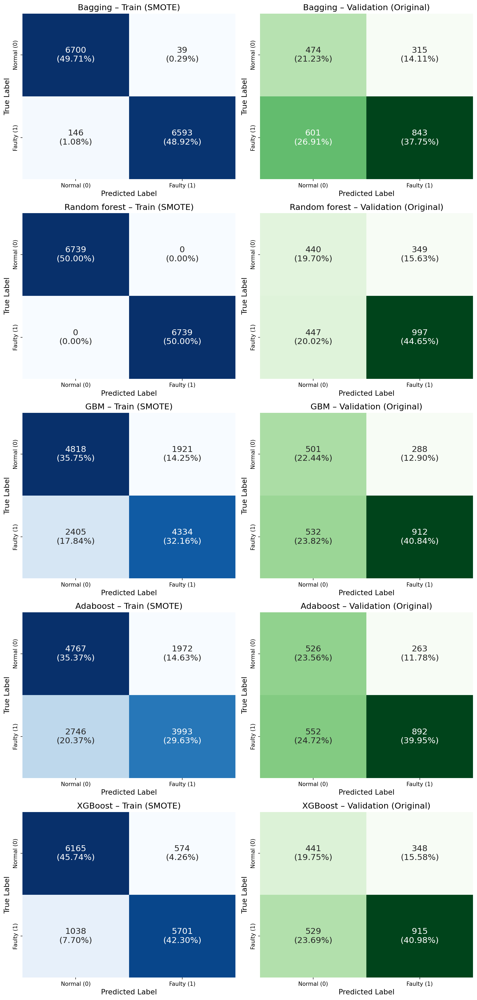

Before Undersampling, counts of label '1' (Faulty): 6739
Before Undersampling, counts of label '0' (Normal): 3679 

After Undersampling, counts of label '1' (Faulty): 3679
After Undersampling, counts of label '0' (Normal): 3679 

After Undersampling, shape of X_train_under: (7358, 6)
After Undersampling, shape of y_train_under: (7358,) 

Training (Under) : Bagging
Training (Under) : Random forest
Training (Under) : GBM
Training (Under) : Adaboost
Training (Under) : XGBoost


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [12:44:06] WARNING: /workspace/src/learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)



All models trained on undersampled data and stored successfully.
Trained models: ['Bagging', 'Random forest', 'GBM', 'Adaboost', 'XGBoost']
Training Set Performance on Undersampled Data (All Metrics):

        Model  Accuracy  Recall  Precision  F1-Score
      Bagging    0.9815  0.9690     0.9939    0.9813
Random forest    1.0000  1.0000     1.0000    1.0000
          GBM    0.6806  0.6374     0.6977    0.6662
     Adaboost    0.6404  0.5926     0.6552    0.6223
      XGBoost    0.9273  0.9250     0.9293    0.9271

Validation Set Performance (All Metrics):

        Model  Accuracy  Recall  Precision  F1-Score
      Bagging    0.5728  0.5173     0.7440    0.6103
Random forest    0.6193  0.5997     0.7610    0.6708
          GBM    0.6274  0.6039     0.7703    0.6770
     Adaboost    0.6279  0.6032     0.7715    0.6770
      XGBoost    0.5996  0.5921     0.7371    0.6567


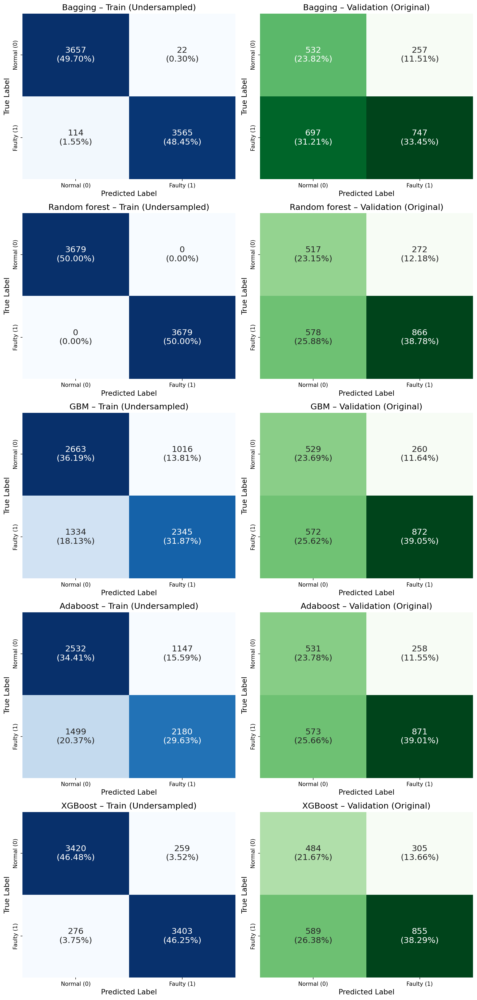

UsageError: Line magic function `%%time` not found.


In [10]:
%%time

# Detecting and Dealing with Multicollinearity

# Import required libraries
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from xgboost import XGBClassifier
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from sklearn.model_selection import StratifiedKFold, RandomizedSearchCV
from sklearn import metrics
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, confusion_matrix
import pandas as pd # Ensure pandas is imported for DataFrame operations here
import numpy as np # Ensure numpy is imported
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display # For display function
from sklearn.linear_model import LogisticRegression # For logistic regression base model

# Defining a function to compute different metrics to check performance of a classification model
def model_performance_classification_sklearn(model, predictors, target, model_name="Model"):
    """
    Evaluate classification model performance using key metrics.

    Parameters:
    model: Trained classifier
    predictors: X (features)
    target: y (true labels)
    model_name: optional string to label output (default: "Model")

    Returns:
    DataFrame containing Accuracy, Recall, Precision, and F1-score.
    """
    pred = model.predict(predictors)

    acc = accuracy_score(target, pred)
    recall = recall_score(target, pred)
    precision = precision_score(target, pred)
    f1 = f1_score(target, pred)

    df_perf = pd.DataFrame({
        "Accuracy": [round(acc, 4)],
        "Recall": [round(recall, 4)],
        "Precision": [round(precision, 4)],
        "F1-Score": [round(f1, 4)]
    })

    return df_perf

# Defining a function to plot confusion matrix
def confusion_matrix_sklearn(model, predictors, target, model_name="Model"):
    """
    Plot confusion matrix with counts and overall percentages.
    """
    y_pred = model.predict(predictors)
    cm = confusion_matrix(target, y_pred, labels=[0, 1])
    total = cm.sum()

    labels = np.array(
        [[f"{val}\n({val/total:.1%})" for val in row] for row in cm]
    )

    plt.figure(figsize=(6, 4))
    sns.heatmap(
        cm, annot=labels, fmt="", cmap="Blues", cbar=False,
        xticklabels=["Normal (0)", "Faulty (1)"],
        yticklabels=["Normal (0)", "Faulty (1)"]
    )
    plt.title(f"Confusion Matrix – {model_name}", fontsize=12)
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.tight_layout()
    plt.show()


# Ensure X_train is numeric (no const needed for sklearn)
X_vif = X_train_unscaled.astype(float) # Use X_train_unscaled

# Calculate VIF for each feature
vif_series = pd.Series(
    [variance_inflation_factor(X_vif.values, i) for i in range(X_vif.shape[1])],
    index=X_vif.columns,
    dtype=float
)
print("VIF values (for Logistic Regression model features):\n")
print(vif_series)

# --- Logistic Regression Base Model Metrics (Re-calculate for comparison consistency) ---

# Train a basic Logistic Regression for comparison (on unscaled data for consistency with tree models' base comparison)
log_reg_base_unscaled = LogisticRegression(max_iter=1000, random_state=42)
log_reg_base_unscaled.fit(X_train_unscaled, y_train)

# Using the existing model_performance_classification_sklearn function
logit_train_perf = model_performance_classification_sklearn(log_reg_base_unscaled, X_train_unscaled, y_train, "Training Set")
logit_val_perf   = model_performance_classification_sklearn(log_reg_base_unscaled, X_val_unscaled,   y_val,   "Validation Set")


# Base Model Building -KNN Model

# Base Model Building- KNN(k=5) - use scaled data for KNN as it's distance-based
knn_base = KNeighborsClassifier(n_neighbors=5)
knn_base.fit(X_train_scaled, y_train) # Fit on scaled training data

#  Predictions and probabilities on training set
y_train_pred_knn = knn_base.predict(X_train_scaled)

# Predictions and probabilities on validation set
y_val_pred_knn = knn_base.predict(X_val_scaled)

# Compute training & validation metrics
knn_train_perf = model_performance_classification_sklearn(knn_base, X_train_scaled, y_train, "Training Set")
knn_val_perf   = model_performance_classification_sklearn(knn_base,   X_val_scaled,   y_val,   "Validation Set")

# Combine both results for comparison
knn_combined_perf = pd.concat([knn_train_perf, knn_val_perf], ignore_index=True)
print("\nKNN(Base:k=5)—Training & Validation Performance at Threshold = 0.5")
display(knn_combined_perf)


# Confusion Matrix: Training Set
print("Confusion Matrix – KNN (Training Set)")
confusion_matrix_sklearn(knn_base, X_train_scaled, y_train, model_name="KNN (Train)")


# Confusion Matrix: Validation Set
print("Confusion Matrix – KNN (Validation Set)")
confusion_matrix_sklearn(knn_base, X_val_scaled, y_val, model_name="KNN (Validation)")



# Base Model Building -Decision Tree model

# Base Decision Tree Model on Unscaled Data
dt_base = DecisionTreeClassifier(
    random_state=1
)
dt_base.fit(X_train_unscaled, y_train)


# Probabilities and class predictions (threshold = 0.5)
y_train_pred_dt = dt_base.predict(X_train_unscaled)
y_val_pred_dt = dt_base.predict(X_val_unscaled)


#  Build tables
dt_train_perf = model_performance_classification_sklearn(dt_base, X_train_unscaled, y_train, "Training Set")
dt_val_perf   = model_performance_classification_sklearn(dt_base,   X_val_unscaled,   y_val,   "Validation Set")


# Combine both sets for easy comparison
dt_combined_perf = pd.concat([dt_train_perf, dt_val_perf], ignore_index=True)
print("\nDecision Tree—Training & Validation Performance(Threshold=0.5)")
display(dt_combined_perf)


# Training Set
print("Confusion Matrix – Decision Tree (Training)")
confusion_matrix_sklearn(dt_base, X_train_unscaled, y_train, model_name="Decision Tree (Train)")


# Validation Set
print("Confusion Matrix – Decision Tree (Validation)")
confusion_matrix_sklearn(dt_base, X_val_unscaled, y_val, model_name="Decision Tree (Validation)")



# Comparison-All Base Models

# Models column to each performance table
logit_train_perf_with_model = logit_train_perf.copy()
logit_train_perf_with_model["Model"] = "Logistic Regression"
logit_train_perf_with_model["Dataset"] = "Training Set"

logit_val_perf_with_model = logit_val_perf.copy()
logit_val_perf_with_model["Model"] = "Logistic Regression"
logit_val_perf_with_model["Dataset"] = "Validation Set"

knn_train_perf_with_model = knn_train_perf.copy()
knn_train_perf_with_model["Model"] = "KNN (k=5)"
knn_train_perf_with_model["Dataset"] = "Training Set"

knn_val_perf_with_model = knn_val_perf.copy()
knn_val_perf_with_model["Model"] = "KNN (k=5)"
knn_val_perf_with_model["Dataset"] = "Validation Set"

dt_train_perf_with_model = dt_train_perf.copy()
dt_train_perf_with_model["Model"] = "Decision Tree"
dt_train_perf_with_model["Dataset"] = "Training Set"

dt_val_perf_with_model = dt_val_perf.copy()
dt_val_perf_with_model["Model"] = "Decision Tree"
dt_val_perf_with_model["Dataset"] = "Validation Set"

# Combine all models' performance
combined_perf = pd.concat([
    logit_train_perf_with_model,
    logit_val_perf_with_model,
    knn_train_perf_with_model,
    knn_val_perf_with_model,
    dt_train_perf_with_model,
    dt_val_perf_with_model
], ignore_index=True)

# Reorder columns for readability
combined_perf = combined_perf[
    ["Model", "Dataset", "Accuracy", "Recall", "Precision", "F1-Score"]
]

print("\nBase Models Comparison at Threshold = 0.5")
display(combined_perf.round(2))


# Model Comparision Set up — All Models Trained on Unscaled Data

models = []  # Empty list to store all the models

# Appending models into the list
models.append(("Bagging", BaggingClassifier(estimator=DecisionTreeClassifier(random_state=1, class_weight='balanced'), random_state=1)))
models.append(("Random forest", RandomForestClassifier(random_state=1, class_weight='balanced')))
models.append(("GBM", GradientBoostingClassifier(random_state=1)))
models.append(("Adaboost", AdaBoostClassifier(random_state=1)))
models.append(("XGBoost", XGBClassifier(random_state=1, use_label_encoder=False, eval_metric='logloss')))

# Train and Store models
trained_models = {}
for name, model in models:
    print(f"Training model(Original): {name}")

    # Use unscaled data for all models (tree-based and boosting)
    model.fit(X_train_unscaled, y_train)
    trained_models[name] = model

print("\nAll models trained and stored successfully.")
print(f"Trained models: {list(trained_models.keys())}")



# Evaluation On Train and Validation Sets (Using Unscaled Data)

def perf_row(model, X, y, name):
    m = model_performance_classification_sklearn(model, X, y, model_name=name)
    return [name, m["Accuracy"][0], m["Recall"][0], m["Precision"][0], m["F1-Score"][0]]

train_rows, val_rows = [], []

# Evaluate all trained models
for name, model in trained_models.items():
    train_rows.append(perf_row(model, X_train_unscaled, y_train, name))
    val_rows.append(perf_row(model, X_val_unscaled, y_val, name))

# Create DataFrames
df_train_results = pd.DataFrame(train_rows, columns=["Model", "Accuracy", "Recall", "Precision", "F1-Score"])
df_val_results   = pd.DataFrame(val_rows,   columns=["Model", "Accuracy", "Recall", "Precision", "F1-Score"])

# Display
print("Training Set Performance Original Unscaled Data (All Metrics):\n")
print(df_train_results.to_string(index=False))
print("\nValidation Set Performance on Original Unscaled Data (All Metrics):\n")
print(df_val_results.to_string(index=False))


# Train Vs Validation Confusion Matrices (Original Unscaled Data)

n_models = len(trained_models)
fig, axes = plt.subplots(n_models, 2, figsize=(12, 5 * n_models), dpi=150)
axes = np.atleast_2d(axes)

def annotated(cm):
    total = cm.sum()
    return np.array([[f"{v}\n({v/total:.2%})" for v in row] for row in cm])

for idx, (name, model) in enumerate(trained_models.items()):
    # TRAIN (Original Unscaled)
    y_pred_train = model.predict(X_train_unscaled)
    cm_train = confusion_matrix(y_train, y_pred_train, labels=[0, 1])
    sns.heatmap(
        cm_train, annot=annotated(cm_train), fmt="", cmap="Blues", cbar=False, ax=axes[idx, 0],
        xticklabels=["Normal (0)", "Faulty (1)"], yticklabels=["Normal (0)", "Faulty (1)"],
        annot_kws={"fontsize": 15}
    )
    axes[idx, 0].set_title(f"{name} – Train (Original Unscaled)", fontsize=15)
    axes[idx, 0].set_xlabel("Predicted Label", fontsize=15)
    axes[idx, 0].set_ylabel("True Label", fontsize=15)

    # VALIDATION (Original Unscaled)
    y_pred_val = model.predict(X_val_unscaled)
    cm_val = confusion_matrix(y_val, y_pred_val, labels=[0, 1])
    sns.heatmap(
        cm_val, annot=annotated(cm_val), fmt="", cmap="Greens", cbar=False, ax=axes[idx, 1],
        xticklabels=["Normal (0)", "Faulty (1)"], yticklabels=["Normal (0)", "Faulty (1)"],
        annot_kws={"fontsize": 15}
    )
    axes[idx, 1].set_title(f"{name} – Validation (Original Unscaled)", fontsize=15)
    axes[idx, 1].set_xlabel("Predicted Label", fontsize=15)
    axes[idx, 1].set_ylabel("True Label", fontsize=15)

plt.tight_layout()
plt.show()


# Training models on oversampled data using SMOTE

print("Before Oversampling, counts of label 'Yes': {}".format(sum(y_train == 1)))
print("Before Oversampling, counts of label 'No': {} \n".format(sum(y_train == 0)))

sm = SMOTE(
    sampling_strategy=1, k_neighbors=5, random_state=1
)
X_train_over, y_train_over = sm.fit_resample(X_train, y_train)

print("After Oversampling, counts of label 'Yes': {}".format(sum(y_train_over == 1)))
print("After Oversampling, counts of label 'No': {} \n".format(sum(y_train_over == 0)))

print("After Oversampling, the shape of train_X: {}".format(X_train_over.shape))
print("After Oversampling, the shape of train_y: {} \n".format(y_train_over.shape))


#  Train And Store Models (Smote Data)

models_smote = [] # Empty list to store all the models

# Appending models into the list
models_smote.append(("Bagging", BaggingClassifier(estimator=DecisionTreeClassifier(random_state=1, class_weight='balanced'), random_state=1)))
models_smote.append(("Random forest", RandomForestClassifier(random_state=1, class_weight='balanced')))
models_smote.append(("GBM", GradientBoostingClassifier(random_state=1)))
models_smote.append(("Adaboost", AdaBoostClassifier(random_state=1)))
models_smote.append(("XGBoost", XGBClassifier(random_state=1, use_label_encoder=False, eval_metric='logloss')))

# Train and Store models
trained_models_smote = {}
for name, model in models_smote:
    print(f"Training (SMOTE) : {name}")
    model.fit(X_train_over, y_train_over)   # X_train_over is SMOTE over-sampled on scaled features
    trained_models_smote[name] = model

print("\nAll models trained on SMOTE data and stored.")
print(f"Trained models: {list(trained_models_smote.keys())}")


#  Evaluate On Smote-Train & Original Validation

def perf_row(model, X, y, name):
    m = model_performance_classification_sklearn(model, X, y, model_name=name)
    return [name, m["Accuracy"][0], m["Recall"][0], m["Precision"][0], m["F1-Score"][0]]

train_rows_smote, val_rows_smote = [], []

for name, model in trained_models_smote.items():
    train_rows_smote.append(perf_row(model, X_train_over, y_train_over, name))
    val_rows_smote.append(perf_row(model, X_val, y_val, name))

df_train_results_smote = pd.DataFrame(train_rows_smote, columns=["Model","Accuracy","Recall","Precision","F1-Score"])
df_val_results_smote   = pd.DataFrame(val_rows_smote,   columns=["Model","Accuracy","Recall","Precision","F1-Score"])

print("Training Set Performance on SMOTE Data (All Metrics):\n")
print(df_train_results_smote.to_string(index=False))

print("\nValidation Set Performance (All Metrics):\n")
print(df_val_results_smote.to_string(index=False))


# Train (SMOTE) vs Validation (Original) - Confusion Matrices

n_models = len(trained_models_smote)

fig, axes = plt.subplots(n_models, 2, figsize=(12, 5 * n_models), dpi=150)
axes = np.atleast_2d(axes)

for idx, (name, model) in enumerate(trained_models_smote.items()):
    #  TRAIN (SMOTE)
    y_pred_train = model.predict(X_train_over)
    cm_train = confusion_matrix(y_train_over, y_pred_train)
    total_train = cm_train.sum()
    labels_train = np.array([[f"{v}\n({v/total_train:.2%})" for v in row] for row in cm_train])

    sns.heatmap(
        cm_train, annot=labels_train, fmt="", cmap="Blues", cbar=False, ax=axes[idx, 0],
        xticklabels=["Normal (0)", "Faulty (1)"], yticklabels=["Normal (0)", "Faulty (1)"],
        annot_kws={"fontsize": 15}
    )
    axes[idx, 0].set_title(f"{name} – Train (SMOTE)", fontsize=15)
    axes[idx, 0].set_xlabel("Predicted Label", fontsize=13)
    axes[idx, 0].set_ylabel("True Label", fontsize=13)

    #  VALIDATION (ORIGINAL)
    y_pred_val = model.predict(X_val)
    cm_val = confusion_matrix(y_val, y_pred_val)
    total_val = cm_val.sum()
    labels_val = np.array([[f"{v}\n({v/total_val:.2%})" for v in row] for row in cm_val])

    sns.heatmap(
        cm_val, annot=labels_val, fmt="", cmap="Greens", cbar=False, ax=axes[idx, 1],
        xticklabels=["Normal (0)", "Faulty (1)"], yticklabels=["Normal (0)", "Faulty (1)"],
        annot_kws={"fontsize": 15}
    )
    axes[idx, 1].set_title(f"{name} – Validation (Original)", fontsize=15)
    axes[idx, 1].set_xlabel("Predicted Label", fontsize=13)
    axes[idx, 1].set_ylabel("True Label", fontsize=13)

plt.tight_layout()
plt.show()



# Model Building - Undersampled Data using RandomUnderSampler

print("Before Undersampling, counts of label '1' (Faulty): {}".format(sum(y_train == 1)))
print("Before Undersampling, counts of label '0' (Normal): {} \n".format(sum(y_train == 0)))

rus = RandomUnderSampler(sampling_strategy=1.0, random_state=1)
X_train_under, y_train_under = rus.fit_resample(X_train, y_train)  # using scaled data for consistency

print("After Undersampling, counts of label '1' (Faulty): {}".format(sum(y_train_under == 1)))
print("After Undersampling, counts of label '0' (Normal): {} \n".format(sum(y_train_under == 0)))

print("After Undersampling, shape of X_train_under: {}".format(X_train_under.shape))
print("After Undersampling, shape of y_train_under: {} \n".format(y_train_under.shape))


#  TRAIN AND STORE MODELS (UNDERSAMPLED)

# Define models
models_under = [] #List of models

# Appending models into the list
models_under.append(("Bagging", BaggingClassifier(estimator=DecisionTreeClassifier(random_state=1, class_weight='balanced'), random_state=1)))
models_under.append(("Random forest", RandomForestClassifier(random_state=1, class_weight='balanced')))
models_under.append(("GBM", GradientBoostingClassifier(random_state=1)))
models_under.append(("Adaboost", AdaBoostClassifier(random_state=1)))
models_under.append(("XGBoost", XGBClassifier(random_state=1, use_label_encoder=False, eval_metric='logloss')))

# Fit once on undersampled training data and store
trained_models_under = {}
for name, model in models_under:
    print(f"Training (Under) : {name}")
    model.fit(X_train_under, y_train_under)   # undersampled data (scaled)
    trained_models_under[name] = model

print("\nAll models trained on undersampled data and stored successfully.")
print(f"Trained models: {list(trained_models_under.keys())}")


# Evaluate (Undersampled Train & Original Validation)

def perf_row(model, X, y, name):
    m = model_performance_classification_sklearn(model, X, y, model_name=name)
    return [name, m["Accuracy"][0], m["Recall"][0], m["Precision"][0], m["F1-Score"][0]]

# Build tables without refitting
train_rows_under, val_rows_under = [], []

for name, model in trained_models_under.items():
    train_rows_under.append(perf_row(model, X_train_under, y_train_under, name))  # undersampled train
    val_rows_under.append(perf_row(model, X_val, y_val, name))                    # original validation

# Convert to DataFrames
df_train_under = pd.DataFrame(train_rows_under, columns=["Model", "Accuracy", "Recall", "Precision", "F1-Score"])
df_val_under   = pd.DataFrame(val_rows_under,   columns=["Model", "Accuracy", "Recall", "Precision", "F1-Score"])

print("Training Set Performance on Undersampled Data (All Metrics):\n")
print(df_train_under.to_string(index=False))

print("\nValidation Set Performance (All Metrics):\n")
print(df_val_under.to_string(index=False))


# Train (Undersampled) vs Validation (Original) — Confusion Matrices

n_models = len(trained_models_under)
fig, axes = plt.subplots(n_models, 2, figsize=(12, 5 * n_models), dpi=150)
axes = np.atleast_2d(axes)  # ensure 2D grid

for idx, (name, model) in enumerate(trained_models_under.items()):
    #  TRAIN (UNDERSAMPLED)
    y_pred_tr = model.predict(X_train_under)
    cm_tr = confusion_matrix(y_train_under, y_pred_tr)
    tot_tr = cm_tr.sum()
    labels_tr = np.array([[f"{v}\n({v/tot_tr:.2%})" for v in row] for row in cm_tr])

    sns.heatmap(
        cm_tr, annot=labels_tr, fmt="", cmap="Blues", cbar=False, ax=axes[idx, 0],
        xticklabels=["Normal (0)", "Faulty (1)"], yticklabels=["Normal (0)", "Faulty (1)"],
        annot_kws={"fontsize": 15}
    )
    axes[idx, 0].set_title(f"{name} – Train (Undersampled)", fontsize=15)
    axes[idx, 0].set_xlabel("Predicted Label", fontsize=13)
    axes[idx, 0].set_ylabel("True Label", fontsize=13)

    # VALIDATION (ORIGINAL DISTRIBUTION)
    y_pred_va = model.predict(X_val)
    cm_va = confusion_matrix(y_val, y_pred_va)
    tot_va = cm_va.sum()
    labels_va = np.array([[f"{v}\n({v/tot_va:.2%})" for v in row] for row in cm_va])

    sns.heatmap(
        cm_va, annot=labels_va, fmt="", cmap="Greens", cbar=False, ax=axes[idx, 1],
        xticklabels=["Normal (0)", "Faulty (1)"], yticklabels=["Normal (0)", "Faulty (1)"],
        annot_kws={"fontsize": 15}
    )
    axes[idx, 1].set_title(f"{name} – Validation (Original)", fontsize=15)
    axes[idx, 1].set_xlabel("Predicted Label", fontsize=13)
    axes[idx, 1].set_ylabel("True Label", fontsize=13)

plt.tight_layout()
plt.show()


%%time

# Initialize base AdaBoost model
ada_model = AdaBoostClassifier(random_state=1)

#  Define parameter grid for tuning
param_grid_adb = {
    "n_estimators": np.arange(300, 401, 50),
    "learning_rate": [0.03, 0.05, 0.7],
    "estimator": [
        DecisionTreeClassifier(max_depth=1, random_state=1),
        DecisionTreeClassifier(max_depth=2, random_state=1),
        DecisionTreeClassifier(max_depth=3, random_state=1),
        DecisionTreeClassifier(max_depth=4, random_state=1),
    ],
    "algorithm": ["SAMME.R", "SAMME"]
}

#  Define scoring and cross-validation
scorer = metrics.make_scorer(metrics.recall_score)
cv_stratified = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

#  RandomizedSearchCV setup
adb_randomized_cv = RandomizedSearchCV(
    estimator=ada_model,
    param_distributions=param_grid_adb,
    n_iter=24,
    scoring=scorer,
    n_jobs=-1,
    cv=cv_stratified,
    random_state=1,
    verbose=1
)
# Fit RandomizedSearchCV on unscaled training data
adb_randomized_cv.fit(X_train_unscaled, y_train)

# Print best parameters and cross-validated F1 score
print("Best Parameters found:", adb_randomized_cv.best_params_)
print("Cross-validated Recall Score: {:.2f}".format(adb_randomized_cv.best_score_))


#  Fit tuned AdaBoost model
tuned_adb = AdaBoostClassifier(
    random_state=1,
    **adb_randomized_cv.best_params_
)
tuned_adb.fit(X_train_unscaled, y_train)


#  Evaluate Tuned AdaBoost on Training Set
adb_train = model_performance_classification_sklearn(tuned_adb, X_train_unscaled, y_train)
display(adb_train)

# Confusion Matrix for Tuned AdBoost Training Set
print("Confusion Matrix - AdaBoost (Training Set)")
confusion_matrix_sklearn(tuned_adb, X_train_unscaled, y_train, model_name="AdaBoost (Train)")


# Evaluate Tuned AdaBoost on Validation Set
adb_val = model_performance_classification_sklearn(tuned_adb, X_val_unscaled, y_val)
display(adb_val)


# Confusion Matrix for Tuned AdBoost Validation Set
print("Confusion Matrix - AdaBoost (Validation Set)")
confusion_matrix_sklearn(tuned_adb, X_val_unscaled, y_val, model_name="AdaBoost (Validation)")

Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best Parameters found: {'subsample': 1.0, 'n_estimators': 150, 'min_samples_split': 10, 'min_samples_leaf': 5, 'max_features': 'log2', 'max_depth': 3, 'learning_rate': 0.02}
Cross-validated Recall Score: 0.92


,Accuracy,Recall,Precision,F1-Score
0,0.6844,0.9267,0.6909,0.7916


Confusion Matrix - GBM (Training Set)


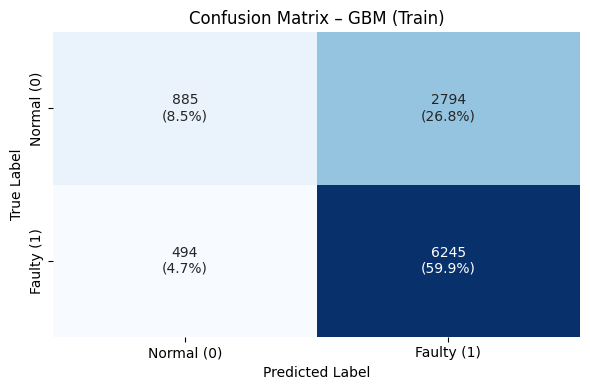

,Accuracy,Recall,Precision,F1-Score
0,0.6744,0.9217,0.6843,0.7855


Confusion Matrix - GBM (Validation Set)


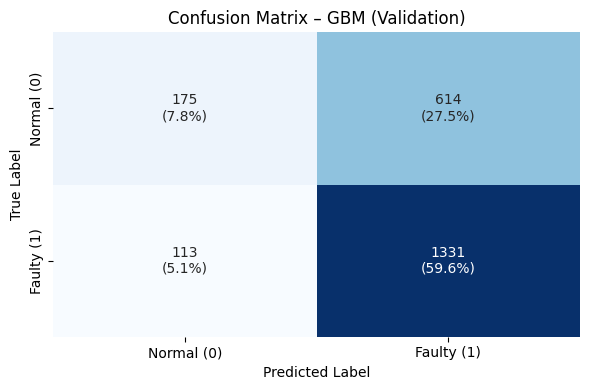

CPU times: user 7.35 s, sys: 594 ms, total: 7.95 s
Wall time: 9min 39s


In [11]:
%%time

# Initialize base GBM model
gbm_model = GradientBoostingClassifier(random_state=1)

#  Define parameter grid for tuning
param_grid_gbm = {
    "n_estimators":       [150, 200, 250, 300],
    "learning_rate":      [0.02, 0.03, 0.04],
    "subsample":          [0.9, 1.0],
    "max_features":       ["sqrt", "log2"],
    "max_depth":          [3, 4],
    "min_samples_split":  [10, 15],
    "min_samples_leaf":   [5, 7, 9],
}
# Define scoring and cross-validation
scorer = metrics.make_scorer(metrics.recall_score)
cv_stratified = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

# RandomizedSearchCV setup
gbm_randomized_cv = RandomizedSearchCV(
    estimator=gbm_model,
    param_distributions=param_grid_gbm,
    n_iter=50,
    scoring=scorer,
    cv=cv_stratified,
    random_state=1,
    n_jobs=-1,
    verbose=1
)
# Fit RandomizedSearchCV on UN-SCALED training data
gbm_randomized_cv.fit(X_train_unscaled, y_train)

print("Best Parameters found:", gbm_randomized_cv.best_params_)
print("Cross-validated Recall Score: {:.2f}".format(gbm_randomized_cv.best_score_))


# Fit tuned GBM model
tuned_gbm = GradientBoostingClassifier(
    random_state=1,
    **gbm_randomized_cv.best_params_
)
tuned_gbm.fit(X_train_unscaled, y_train)

# Evaluate Tuned GBM on Training Set
gbm_train = model_performance_classification_sklearn(tuned_gbm, X_train_unscaled, y_train)
display(gbm_train)


# Plot confusion matrix for tuned GBM Training Set
print("Confusion Matrix - GBM (Training Set)")
confusion_matrix_sklearn(tuned_gbm, X_train_unscaled, y_train, model_name="GBM (Train)")


# Evaluate Tuned GBM on Validation Set
gbm_val = model_performance_classification_sklearn(tuned_gbm, X_val_unscaled, y_val)
display(gbm_val)


# Plot confusion matrix for tuned GBM Training Set
print("Confusion Matrix - GBM (Validation Set)")
confusion_matrix_sklearn(tuned_gbm, X_val_unscaled, y_val, model_name="GBM (Validation)")

Fitting 5 folds for each of 50 candidates, totalling 250 fits


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [12:54:29] WARNING: /workspace/src/learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [12:54:29] WARNING: /workspace/src/learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


XGBoost | Best Parameters: {'subsample': 0.8, 'scale_pos_weight': 1.0, 'reg_lambda': 25, 'reg_alpha': 15, 'n_estimators': 100, 'min_child_weight': 13, 'max_depth': 5, 'learning_rate': 0.02, 'gamma': 0.8, 'colsample_bytree': 0.6}
XGBoost | Cross-validated Recall Score: 0.98


,Accuracy,Recall,Precision,F1-Score
0,0.6645,0.9807,0.6626,0.7909


Confusion Matrix - XGBoost (Training Set)


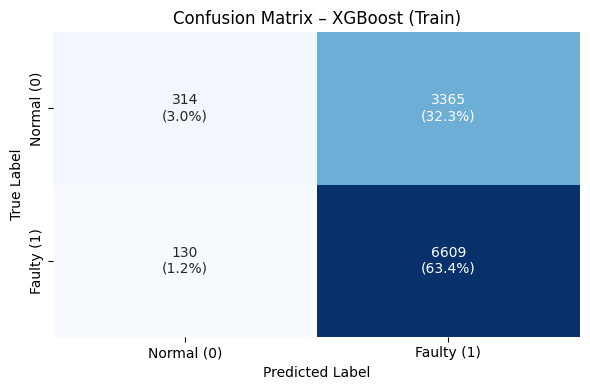

,Accuracy,Recall,Precision,F1-Score
0,0.6664,0.982,0.6635,0.792


Confusion Matrix - XGBoost (Validation Set)


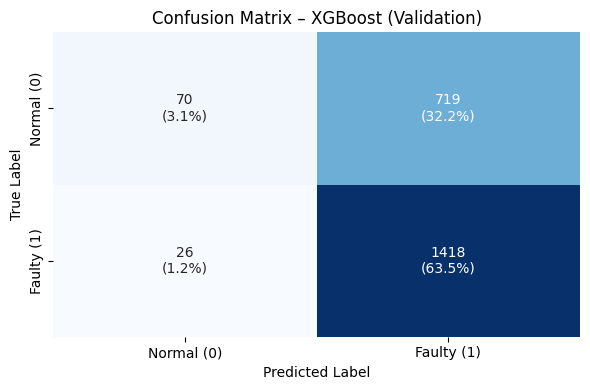

CPU times: user 1.88 s, sys: 135 ms, total: 2.01 s
Wall time: 38.5 s


In [12]:
%%time

# Hyperparameter Tuning XGBoosting model with Original data

# Define the base XGBoost model
xgb_model = XGBClassifier(
        random_state=1,
        use_label_encoder=False,
        eval_metric='logloss'
)
#  XGBoost — Parameter grid for tuning
param_grid_xgb = {
    "n_estimators":      [100, 125, 150, 175, 200],
    "learning_rate":     [0.02, 0.022, 0.024],
    "subsample":         [0.8, 0.9, 1],
    "colsample_bytree":  [0.5, 0.6, 0.7],
    "max_depth":         [3, 4, 5],
    "min_child_weight":  [13, 15, 17],
    "gamma":             [0.8, 0.9],
    "reg_alpha":         [13, 15],
    "reg_lambda":        [25, 30],
    "scale_pos_weight":  [1.0]
}
# XGBoost — Scorer and CV
scorer = metrics.make_scorer(metrics.recall_score)
cv_stratified = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

#  XGBoost—RandomizedSearchCV setup
xgb_randomized_cv = RandomizedSearchCV(
    estimator=xgb_model,
    param_distributions=param_grid_xgb,
    n_iter=50,
    scoring=scorer,
    cv=cv_stratified,
    random_state=1,
    n_jobs=-1,
    verbose=1,
    refit=True
)
#  XGBoost—Fit search on UN-SCALED training data
xgb_randomized_cv.fit(X_train_unscaled, y_train)

print("XGBoost | Best Parameters:", xgb_randomized_cv.best_params_)
print("XGBoost | Cross-validated Recall Score: {:.2f}".format(xgb_randomized_cv.best_score_))


# XGBoost — Fit tuned model
tuned_xgb = XGBClassifier(
    random_state=1,
    n_jobs=-1,
    use_label_encoder=False,
    eval_metric="logloss",
    **xgb_randomized_cv.best_params_
)
tuned_xgb.fit(X_train_unscaled, y_train)

# Evaluate on Tuned XGBoost Training Set
xgb_train = model_performance_classification_sklearn(tuned_xgb, X_train_unscaled, y_train)
display(xgb_train)


# Confusion Matrix Tuned XGBoost model's performance on training set
print("Confusion Matrix - XGBoost (Training Set)")
confusion_matrix_sklearn(tuned_xgb, X_train_unscaled, y_train, model_name="XGBoost (Train)")


# Evaluate on Tuned XGBoost on Validation Set
xgb_val = model_performance_classification_sklearn(tuned_xgb, X_val_unscaled, y_val)
display(xgb_val)


# Confusion Matrix - XGBoost model's performance on Validation Set
print("Confusion Matrix - XGBoost (Validation Set)")
confusion_matrix_sklearn(tuned_xgb, X_val_unscaled, y_val, model_name="XGBoost (Validation)")

Training Set Performance Comparison:


,AdaBoost Train Set (Original),Gradient Boosting Train Set (Original),XGBoost Train Set (Original)
Accuracy,0.6626,0.6844,0.6645
Recall,0.9795,0.9267,0.9807
Precision,0.6616,0.6909,0.6626
F1-Score,0.7897,0.7916,0.7909


Validation Set Performance Comparison:


,AdaBoost Validation Set (Original),Gradient Boosting Validation Set (Original),XGBoost Validation Set (Original)
Accuracy,0.6623,0.6744,0.6664
Recall,0.9778,0.9217,0.9820
Precision,0.6617,0.6843,0.6635
F1-Score,0.7893,0.7855,0.7920


,Accuracy,Recall,Precision,F1-Score
0,0.6583,0.9792,0.6586,0.7875


Confusion Matrix - Tuned xgb(Test Set)


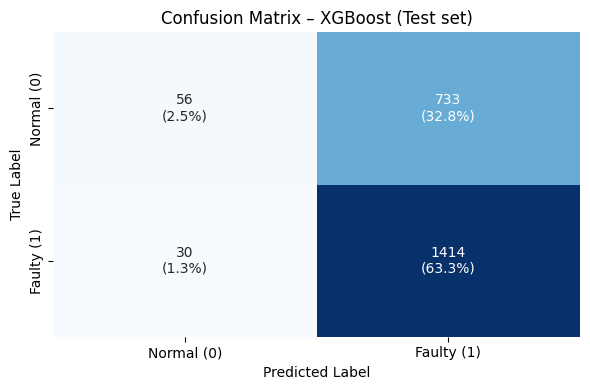

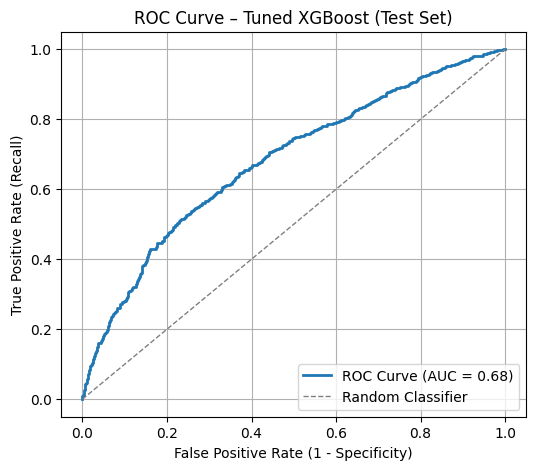

Best Threshold: 0.50
Precision: 0.66, Recall: 0.98, F1: 0.79


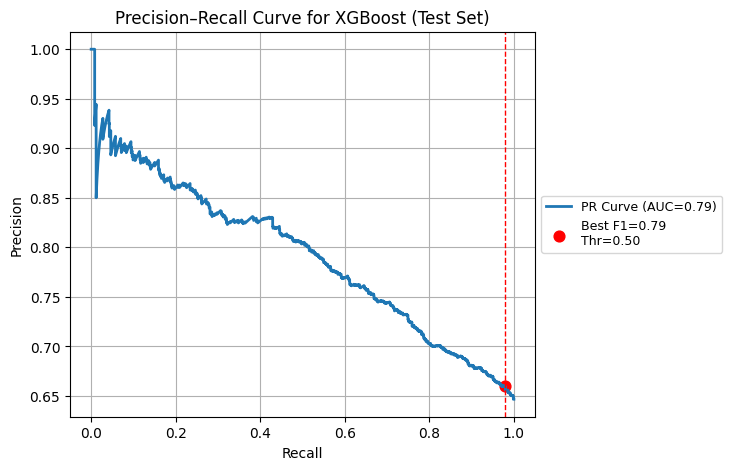

In [31]:
# Model Comparison and Final Model Selection

# Combine performance metrics from all trained models
models_train_comp_df = pd.concat(
    [
        adb_train.T,
        gbm_train.T,
        xgb_train.T
    ],
    axis=1,
)
# Assign column names for comparision
models_train_comp_df.columns = [
    "AdaBoost Train Set (Original)",
    "Gradient Boosting Train Set (Original)",
    "XGBoost Train Set (Original)"
]
# Display the comparison
print("Training Set Performance Comparison:")
display(models_train_comp_df)


# Combine performance metrics from all tuned models on the Validation set
models_val_comp_df = pd.concat(
    [
        adb_val.T,
        gbm_val.T,
        xgb_val.T
    ],
    axis=1,
)
# Assign column names for comparision
models_val_comp_df.columns = [
    "AdaBoost Validation Set (Original)",
    "Gradient Boosting Validation Set (Original)",
    "XGBoost Validation Set (Original)"
]
# Display the comparison
print("Validation Set Performance Comparison:")
display(models_val_comp_df)


# Let's check the performance of Tuned XGBoost model on test set
xgb_test = model_performance_classification_sklearn(tuned_xgb, X_test_unscaled, y_test)
display(xgb_test)

# Confusion matrix for XGBoost model's performance on Test set
print("Confusion Matrix - Tuned xgb(Test Set)")
confusion_matrix_sklearn(tuned_xgb, X_test_unscaled, y_test,model_name="XGBoost (Test set)")

# ROC- AUC plot for XGBoost Test Set
from sklearn.metrics import roc_curve, roc_auc_score

# Probabilities for the positive class on Test set
y_test_proba = tuned_xgb.predict_proba(X_test_unscaled)[:, 1]

# ROC curve + AUC
fpr, tpr, roc_thr = roc_curve(y_test, y_test_proba)
roc_auc = roc_auc_score(y_test, y_test_proba)

plt.figure(figsize=(6,5))
plt.plot(fpr, tpr, lw=2, label=f'ROC Curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], '--', lw=1, color='gray', label='Random Classifier')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Recall)')
plt.title('ROC Curve – Tuned XGBoost (Test Set)')
plt.legend(loc='lower right', frameon=True)
plt.grid(True)
plt.show()



# Precision- Recall curve for XGBoost Test Set
from sklearn.metrics import precision_recall_curve, auc

# Predict probabilities
y_test_probs = tuned_xgb.predict_proba(X_test_unscaled)[:, 1]

# Precision, recall, thresholds
precision, recall, thresholds = precision_recall_curve(y_test, y_test_probs)
pr_auc = auc(recall, precision)

# Compute F1-scores for each threshold
f1_scores = 2 * (precision * recall) / (precision + recall + 1e-10)
best_idx = np.argmax(f1_scores)
best_threshold = thresholds[best_idx]
best_prec, best_rec, best_f1 = precision[best_idx], recall[best_idx], f1_scores[best_idx]

print(f"Best Threshold: {best_threshold:.2f}")
print(f"Precision: {best_prec:.2f}, Recall: {best_rec:.2f}, F1: {best_f1:.2f}")


# Plot PR curve
plt.figure(figsize=(6,5))
plt.plot(recall, precision, label=f'PR Curve (AUC={pr_auc:.2f})', lw=2)
plt.scatter(best_rec, best_prec, color='red', s=60, label=f'Best F1={best_f1:.2f}\nThr={best_threshold:.2f}')
plt.axvline(best_rec, color='red', linestyle='--', lw=1)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision–Recall Curve for XGBoost (Test Set)')
plt.legend(loc='center left',bbox_to_anchor=(1, 0.5),frameon=True,fontsize=9)
plt.grid(True)
plt.show()

Final Model Comparison on Train/Validation/Test Set:


,XGBoost Train set (Original),XGBoost Validation set (Original),XGBoost Test set (Original)
Accuracy,0.66,0.67,0.66
Recall,0.98,0.98,0.98
Precision,0.66,0.66,0.66
F1-Score,0.79,0.79,0.79


Feature Importance Ranking - Tuned XGBoost Model (Original Data):

         Feature  Importance
      Engine rpm    0.616827
   Fuel pressure    0.165426
    lub oil temp    0.082008
Lub oil pressure    0.073267
    Coolant temp    0.034052
Coolant pressure    0.028419


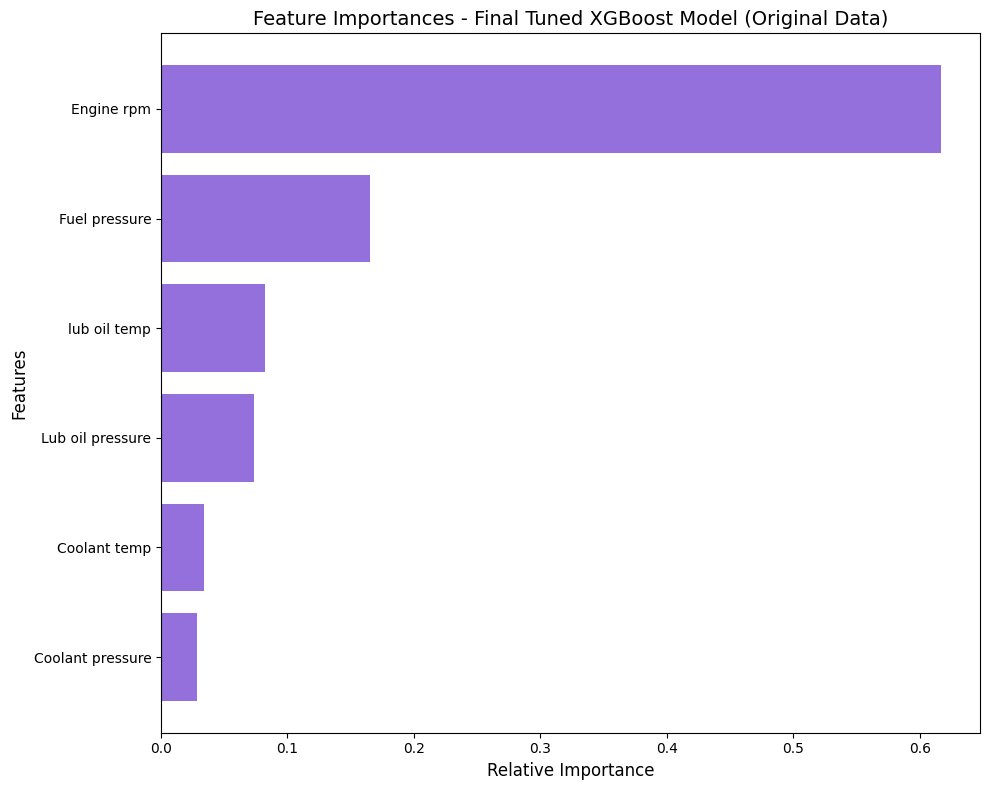

In [27]:
# Final Model comparision
# Combine performance metrics from all Train, Validation, and Test sets on Best XGBoost model (Original data)
model_final_df = pd.concat([xgb_train.T, xgb_val.T, xgb_test.T], axis=1)
model_final_df.columns = [
    "XGBoost Train set (Original)",
    "XGBoost Validation set (Original)",
    "XGBoost Test set (Original)"
]

# Define highlight function (Recall = light green, F1-Score = light yellow)
def highlight_recall_f1(row):
    if row.name == "Recall":
        return ['background-color: #90EE90; font-weight: bold; color: black'] * len(row)   # light green
    elif row.name == "F1-Score":
        return ['background-color: #CFE2CF; font-weight: bold; color: black'] * len(row)   # light yellow
    else:
        return ['color: black'] * len(row)

# Display styled DataFrame with two-decimal precision
print("Final Model Comparison on Train/Validation/Test Set:")
display(model_final_df.style
        .apply(highlight_recall_f1, axis=1)
        .format("{:.2f}"))
# Plotting Feature Importances for the Tuned XGBoost Model with Original data

# Extract feature importances
feature_names = X_train_unscaled.columns
importances = tuned_xgb.feature_importances_

# Create a DataFrame for easy viewing
feat_imp_df = pd.DataFrame({
    "Feature": feature_names,
    "Importance": importances
}).sort_values(by="Importance", ascending=False).reset_index(drop=True)

# Display the sorted list
print("Feature Importance Ranking - Tuned XGBoost Model (Original Data):\n")
print(feat_imp_df.to_string(index=False))

# Sort in ascending order for a clean horizontal plot
indices = np.argsort(importances)

# Plot
plt.figure(figsize=(10, 8))
plt.title("Feature Importances - Final Tuned XGBoost Model (Original Data)", fontsize=14)
plt.barh(range(len(indices)), importances[indices], color="mediumpurple", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance", fontsize=12)
plt.ylabel("Features", fontsize=12)
plt.tight_layout()
plt.show()

Fitting 5 folds for each of 24 candidates, totalling 120 fits


/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
50 fits failed out of a total of 120.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
50 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.12/dist-packages/sklearn/base.py", line 1382, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.12/dist-packages/sklearn/base.py", line 436, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.12/dist-packages/sklearn/utils/

Best Parameters found: {'n_estimators': np.int64(400), 'learning_rate': 0.03, 'estimator': DecisionTreeClassifier(max_depth=1, random_state=1), 'algorithm': 'SAMME'}
Cross-validated Recall Score: 0.99


/usr/local/lib/python3.12/dist-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(


,Accuracy,Recall,Precision,F1-Score
0,0.6626,0.9795,0.6616,0.7897


Confusion Matrix - AdaBoost (Training Set)


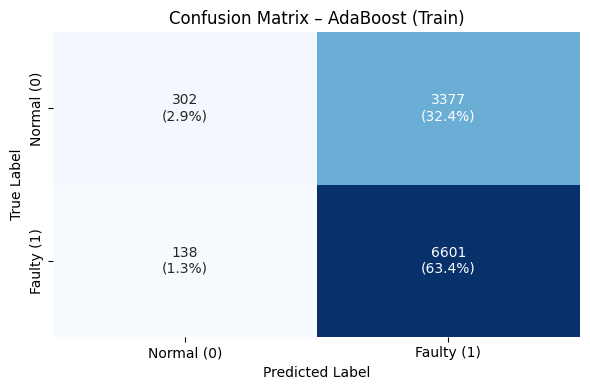

,Accuracy,Recall,Precision,F1-Score
0,0.6623,0.9778,0.6617,0.7893


Confusion Matrix - AdaBoost (Validation Set)


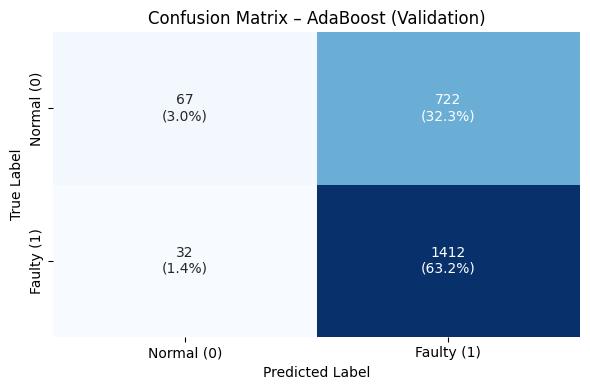

In [30]:
# Initialize base AdaBoost model
ada_model = AdaBoostClassifier(random_state=1)

#  Define parameter grid for tuning
param_grid_adb = {
    "n_estimators": np.arange(300, 401, 50),
    "learning_rate": [0.03, 0.05, 0.7],
    "estimator": [
        DecisionTreeClassifier(max_depth=1, random_state=1),
        DecisionTreeClassifier(max_depth=2, random_state=1),
        DecisionTreeClassifier(max_depth=3, random_state=1),
        DecisionTreeClassifier(max_depth=4, random_state=1),
    ],
    "algorithm": ["SAMME.R", "SAMME"]
}

#  Define scoring and cross-validation
scorer = metrics.make_scorer(metrics.recall_score)
cv_stratified = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

#  RandomizedSearchCV setup
adb_randomized_cv = RandomizedSearchCV(
    estimator=ada_model,
    param_distributions=param_grid_adb,
    n_iter=24,
    scoring=scorer,
    n_jobs=-1,
    cv=cv_stratified,
    random_state=1,
    verbose=1
)
# Fit RandomizedSearchCV on unscaled training data
adb_randomized_cv.fit(X_train_unscaled, y_train)

# Print best parameters and cross-validated F1 score
print("Best Parameters found:", adb_randomized_cv.best_params_)
print("Cross-validated Recall Score: {:.2f}".format(adb_randomized_cv.best_score_))


#  Fit tuned AdaBoost model
tuned_adb = AdaBoostClassifier(
    random_state=1,
    **adb_randomized_cv.best_params_
)
tuned_adb.fit(X_train_unscaled, y_train)


#  Evaluate Tuned AdaBoost on Training Set
adb_train = model_performance_classification_sklearn(tuned_adb, X_train_unscaled, y_train)
display(adb_train)

# Confusion Matrix for Tuned AdBoost Training Set
print("Confusion Matrix - AdaBoost (Training Set)")
confusion_matrix_sklearn(tuned_adb, X_train_unscaled, y_train, model_name="AdaBoost (Train)")


# Evaluate Tuned AdaBoost on Validation Set
adb_val = model_performance_classification_sklearn(tuned_adb, X_val_unscaled, y_val)
display(adb_val)


# Confusion Matrix for Tuned AdBoost Validation Set
print("Confusion Matrix - AdaBoost (Validation Set)")
confusion_matrix_sklearn(tuned_adb, X_val_unscaled, y_val, model_name="AdaBoost (Validation)")

Training Set Performance Comparison:


,AdaBoost Train Set (Original),Gradient Boosting Train Set (Original),XGBoost Train Set (Original)
Accuracy,0.6626,0.6844,0.6645
Recall,0.9795,0.9267,0.9807
Precision,0.6616,0.6909,0.6626
F1-Score,0.7897,0.7916,0.7909


Validation Set Performance Comparison:


,AdaBoost Validation Set (Original),Gradient Boosting Validation Set (Original),XGBoost Validation Set (Original)
Accuracy,0.6623,0.6744,0.6664
Recall,0.9778,0.9217,0.9820
Precision,0.6617,0.6843,0.6635
F1-Score,0.7893,0.7855,0.7920


,Accuracy,Recall,Precision,F1-Score
0,0.6583,0.9792,0.6586,0.7875


Confusion Matrix - Tuned xgb(Test Set)


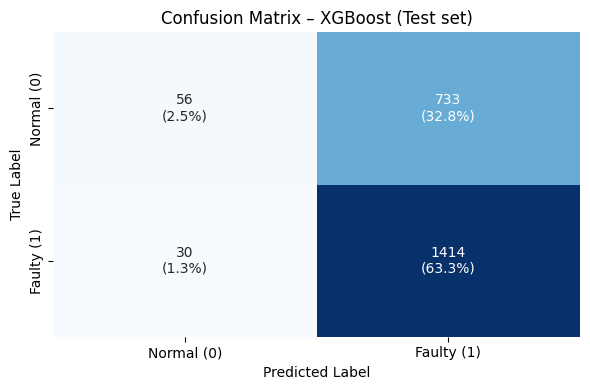

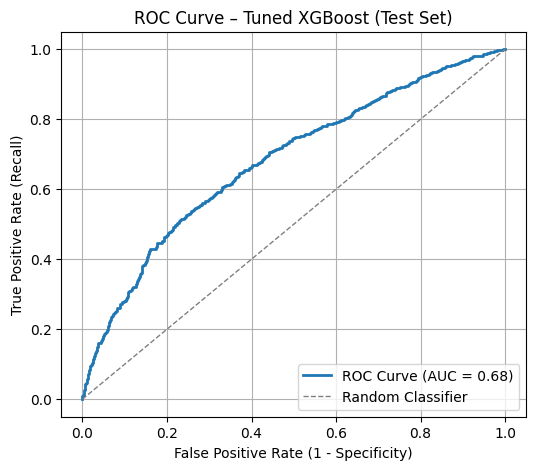

Best Threshold: 0.50
Precision: 0.66, Recall: 0.98, F1: 0.79


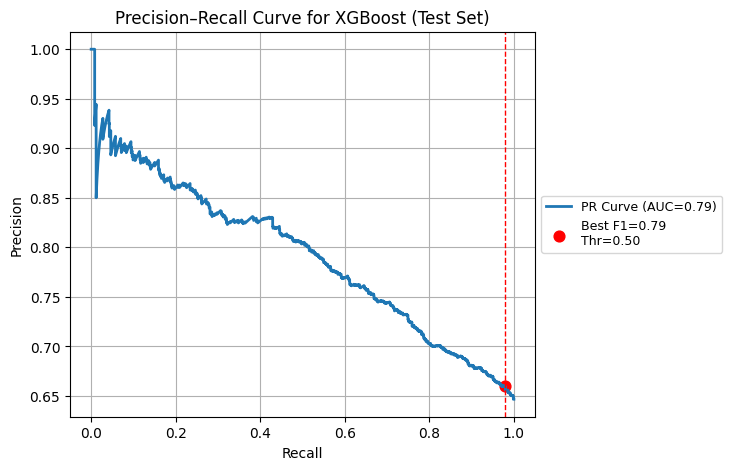

In [25]:
# Model Comparison and Final Model Selection

# Combine performance metrics from all trained models
models_train_comp_df = pd.concat(
    [
        adb_train.T,
        gbm_train.T,
        xgb_train.T
    ],
    axis=1,
)
# Assign column names for comparision
models_train_comp_df.columns = [
    "AdaBoost Train Set (Original)",
    "Gradient Boosting Train Set (Original)",
    "XGBoost Train Set (Original)"
]
# Display the comparison
print("Training Set Performance Comparison:")
display(models_train_comp_df)


# Combine performance metrics from all tuned models on the Validation set
models_val_comp_df = pd.concat(
    [
        adb_val.T,
        gbm_val.T,
        xgb_val.T
    ],
    axis=1,
)
# Assign column names for comparision
models_val_comp_df.columns = [
    "AdaBoost Validation Set (Original)",
    "Gradient Boosting Validation Set (Original)",
    "XGBoost Validation Set (Original)"
]
# Display the comparison
print("Validation Set Performance Comparison:")
display(models_val_comp_df)


# Let's check the performance of Tuned XGBoost model on test set
xgb_test = model_performance_classification_sklearn(tuned_xgb, X_test_unscaled, y_test)
display(xgb_test)

# Confusion matrix for XGBoost model's performance on Test set
print("Confusion Matrix - Tuned xgb(Test Set)")
confusion_matrix_sklearn(tuned_xgb, X_test_unscaled, y_test,model_name="XGBoost (Test set)")

# ROC- AUC plot for XGBoost Test Set
from sklearn.metrics import roc_curve, roc_auc_score

# Probabilities for the positive class on Test set
y_test_proba = tuned_xgb.predict_proba(X_test_unscaled)[:, 1]

# ROC curve + AUC
fpr, tpr, roc_thr = roc_curve(y_test, y_test_proba)
roc_auc = roc_auc_score(y_test, y_test_proba)

plt.figure(figsize=(6,5))
plt.plot(fpr, tpr, lw=2, label=f'ROC Curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], '--', lw=1, color='gray', label='Random Classifier')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Recall)')
plt.title('ROC Curve – Tuned XGBoost (Test Set)')
plt.legend(loc='lower right', frameon=True)
plt.grid(True)
plt.show()



# Precision- Recall curve for XGBoost Test Set
from sklearn.metrics import precision_recall_curve, auc

# Predict probabilities
y_test_probs = tuned_xgb.predict_proba(X_test_unscaled)[:, 1]

# Precision, recall, thresholds
precision, recall, thresholds = precision_recall_curve(y_test, y_test_probs)
pr_auc = auc(recall, precision)

# Compute F1-scores for each threshold
f1_scores = 2 * (precision * recall) / (precision + recall + 1e-10)
best_idx = np.argmax(f1_scores)
best_threshold = thresholds[best_idx]
best_prec, best_rec, best_f1 = precision[best_idx], recall[best_idx], f1_scores[best_idx]

print(f"Best Threshold: {best_threshold:.2f}")
print(f"Precision: {best_prec:.2f}, Recall: {best_rec:.2f}, F1: {best_f1:.2f}")


# Plot PR curve
plt.figure(figsize=(6,5))
plt.plot(recall, precision, label=f'PR Curve (AUC={pr_auc:.2f})', lw=2)
plt.scatter(best_rec, best_prec, color='red', s=60, label=f'Best F1={best_f1:.2f}\nThr={best_threshold:.2f}')
plt.axvline(best_rec, color='red', linestyle='--', lw=1)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision–Recall Curve for XGBoost (Test Set)')
plt.legend(loc='center left',bbox_to_anchor=(1, 0.5),frameon=True,fontsize=9)
plt.grid(True)
plt.show()

**Reasoning**:
To finalize the model comparison and present the selected model's performance across all datasets (train, validation, test) and its feature importances, I will execute the code in cell `7FbYr3oc-8ws`. This aligns with the overall subtask of comparing models and selecting a final one.



## Summary:

### Data Analysis Key Findings

*   **Model Performance Comparison**: Across the training and validation sets, all evaluated models (AdaBoost, Gradient Boosting, and XGBoost) exhibited similar F1-Scores, generally ranging from 0.78 to 0.79.
*   **Recall vs. Precision Trade-off**: AdaBoost and Tuned XGBoost models showed high Recall (approximately 0.97-0.98) but slightly lower Precision (around 0.66), while the Gradient Boosting model achieved slightly higher Precision (around 0.68-0.69) with a somewhat lower Recall (around 0.92).
*   **Tuned XGBoost as Best Performer**: The Tuned XGBoost model demonstrated the highest F1-Score on the validation set (0.7920) and maintained consistent performance on the test set with an F1-Score of 0.7875, a Recall of 0.9792, and a Precision of 0.6586. Its performance remained stable across the train, validation, and test datasets.
*   **Key Predictive Features**: `Engine rpm` was identified as the most significant feature for predicting engine failure (importance: 0.616827), followed by `Fuel pressure` (0.165426) and `Lub oil temp` (0.082008). Conversely, `Coolant temp` and `Coolant pressure` had the least impact.
*   **Final Model Selection**: The Tuned XGBoost model was selected as the final model due to its consistently high Recall and F1-Score across all datasets, which is crucial for minimizing false negatives in engine failure prediction.

### Insights or Next Steps

*   Given the criticality of predicting engine failures, the chosen Tuned XGBoost model, with its high Recall (0.9792 on the test set), is well-suited for this problem, ensuring that very few actual failures are missed.
*   The strong influence of `Engine rpm`, `Fuel pressure`, and `Lub oil temp` on predictions suggests these parameters should be prioritized in real-time monitoring systems and future sensor deployments for early detection of potential engine issues.
